# **🚀 Retail Store Product Sales Simulation — EDA & Business Insights**

Welcome to this **Retail Store Product Sales Simulation** notebook.  
This dataset is a **synthetic but realistic retail sales simulation**, designed to mimic real-world operational and marketing dynamics.

The goal of this notebook is not just to perform standard EDA, but to extract **actionable business insights** and identify **key drivers of demand, customer experience, and operational performance**.

---

## **🔍 What This Notebook Covers**

This notebook follows a **business-first EDA approach**, focusing on:

### **1️⃣ Data Understanding & Sanity Checks** 
- Verify data quality and detect synthetic patterns  
- Confirm all variables are continuous and realistic  
- Remove unnecessary columns (e.g., index columns)

### **2️⃣ Distribution Analysis**
- Understand market positioning through **price and discount distributions**  
- Analyze customer traffic behavior via **footfall**  
- Evaluate marketing strategy through **ad spend distribution**  
- Study product quality through **return rate distribution**

### **3️⃣ Pricing & Discount Dynamics** 
- Study how price and discount affect footfall  
- Identify discount thresholds that trigger demand spikes  
- Determine if promotions compensate for premium pricing

### **4️⃣ Promotion & Advertising Effectiveness**  
- Analyze how promotion intensity drives footfall  
- Study ad spend ROI and diminishing returns  
- Explore interactions between promotion, pricing, and competitor pricing

### **5️⃣ Competitive Positioning**  
- Compare pricing vs competitor pricing  
- Identify scenarios where competitor undercutting affects demand  
- Understand how customers tolerate higher prices with promotions

### **6️⃣ Inventory & Stock Level Intelligence**  
- Identify stock-out and overstock risks  
- Analyze stock vs footfall mismatches  
- Explore relationships between stock level and return rate

### **7️⃣ Customer Sentiment & Experience**  
- Study sentiment’s effect on returns  
- Analyze sentiment vs discounts and promotions  
- Discover how customer experience mediates demand

### **8️⃣ Weather Impact on Sales**  
- Study how weather affects footfall  
- Analyze how weather influences promotion effectiveness  
- Discover weather-adjusted demand patterns

### **9️⃣ Return Rate Analysis**  
- Identify drivers of returns  
- Explore impact of discounts, sentiment, and promotions  
- Detect hidden losses and customer dissatisfaction signals

### **🔟 Correlation & Interaction Insights**  
- Detect feature clusters and redundancy  
- Identify causal potential relationships  
- Discover unexpected correlations

### **1️⃣1️⃣ Business Scenarios & Segmentation**  
- Segment customers and scenarios for strategic decisions  
- Identify high-risk and high-opportunity segments  
- Provide business-level recommendations

---

## **🎯 Key Notebook Goal**

> **Not all footfall is good footfall.**  
> High traffic with low sentiment often leads to higher return rates, making demand growth unsustainable without customer satisfaction improvements.

---

## **🧠 Why This Notebook is Valuable**

This notebook is designed to be:
- **Insight-driven** (not just plots)
- **Business-focused** (actionable recommendations)
- **Model-ready** (feature engineering for future ML tasks)
- **Unique** (goes beyond basic EDA with advanced scenario analysis)

---

Let’s begin the analysis. 🚀


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [2]:
df = pd.read_csv("/kaggle/input/retail-store-product-sales-simulation-dataset/RetailStoreProductSalesDataset.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           15000 non-null  int64  
 1   price                15000 non-null  float64
 2   discount             15000 non-null  float64
 3   promotion_intensity  15000 non-null  float64
 4   footfall             15000 non-null  float64
 5   ad_spend             15000 non-null  float64
 6   competitor_price     15000 non-null  float64
 7   stock_level          15000 non-null  float64
 8   weather_index        15000 non-null  float64
 9   customer_sentiment   15000 non-null  float64
 10  return_rate          15000 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 1.3 MB


In [4]:
df.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
df.head()

,price,discount,promotion_intensity,footfall,ad_spend,competitor_price,stock_level,weather_index,customer_sentiment,return_rate
0,45.197454,5.514259,4.062653,277.017484,2559.073870,44.255411,1176.981397,7.442194,1.021762,0.067388
1,49.327512,6.572035,4.964657,250.760714,2536.417155,50.331704,1219.359497,6.759510,0.975142,0.082719
2,47.328457,6.972713,4.363191,263.130478,2552.952356,49.285996,1263.822738,5.941689,0.871567,0.061600
3,50.964538,4.808234,3.577988,297.603918,2605.398826,46.839936,1182.435378,8.517014,1.071300,0.052215
4,44.530213,8.180216,4.966638,208.931691,2432.485683,45.336500,1178.513263,8.422473,1.068515,0.057975


In [6]:
df.sample(10)

,price,discount,promotion_intensity,footfall,ad_spend,competitor_price,stock_level,weather_index,customer_sentiment,return_rate
11494,51.209784,11.223417,5.157678,280.300655,2463.656174,48.041443,1158.593876,11.546509,0.994871,0.082338
5651,62.093078,9.384024,5.668733,292.153114,2550.418397,67.550514,1188.805217,11.104726,0.841405,0.071056
1055,48.277575,10.169005,4.931113,230.774386,2552.141147,45.829318,1216.919741,10.603045,1.005653,0.071845
10216,55.377406,12.402241,6.107176,300.631830,2571.884139,56.997034,1177.645459,8.714355,1.109093,0.033705
5318,37.976088,10.826954,5.022686,223.989227,2462.741473,40.694153,1196.420423,8.146951,0.918908,0.076388
3845,48.995928,2.224987,2.328585,279.781588,2549.604903,48.727647,1224.996199,5.142069,1.046126,0.051034
9380,64.465211,0.820904,1.420798,236.539087,2535.055144,61.544635,1192.544863,5.466053,0.792528,0.072073
11514,61.908328,9.782667,5.741854,307.082884,2572.465480,64.778805,1158.481119,9.578020,1.150694,0.031313
194,44.293445,9.361552,5.309115,287.379421,2668.966462,45.098844,1269.467940,8.362009,1.122694,0.068411
12853,48.611383,4.161959,3.626441,209.836562,2468.116758,46.873068,1151.663796,7.152999,0.976002,0.079988


# **1️⃣ Data Understanding & Sanity Checks (Foundation)**

### **🔹 1. Distribution Check for All Numeric Features**
**🎯 Goal**

**Verify:**

- Continuous numeric signals
- Unrealistic ranges
- Synthetic smoothness

**📊 Plot: Histograms (Grid)**

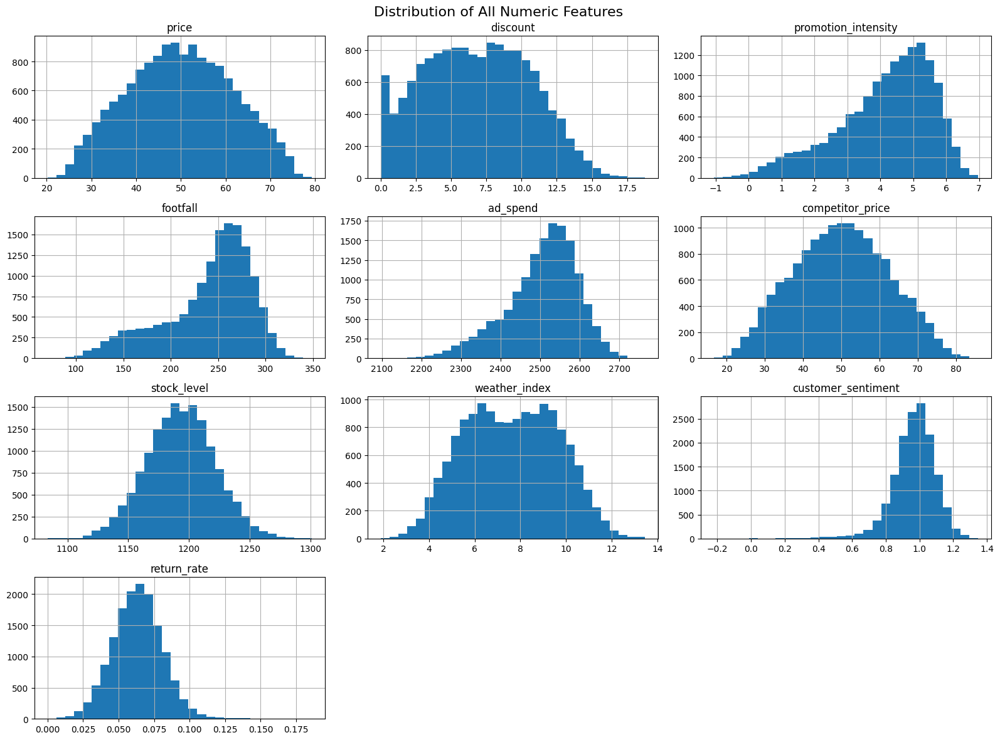

In [7]:
df.hist(
    figsize=(16, 12),
    bins=30
)
plt.suptitle("Distribution of All Numeric Features", fontsize=16)
plt.tight_layout()
plt.show()

### **🔹 2. Boxplots for Outlier & Range Detection**
**🎯 Goal**

**Detect:**

- Extreme values
- Out-of-bound business logic violations

**📊 Plot: Boxplots**

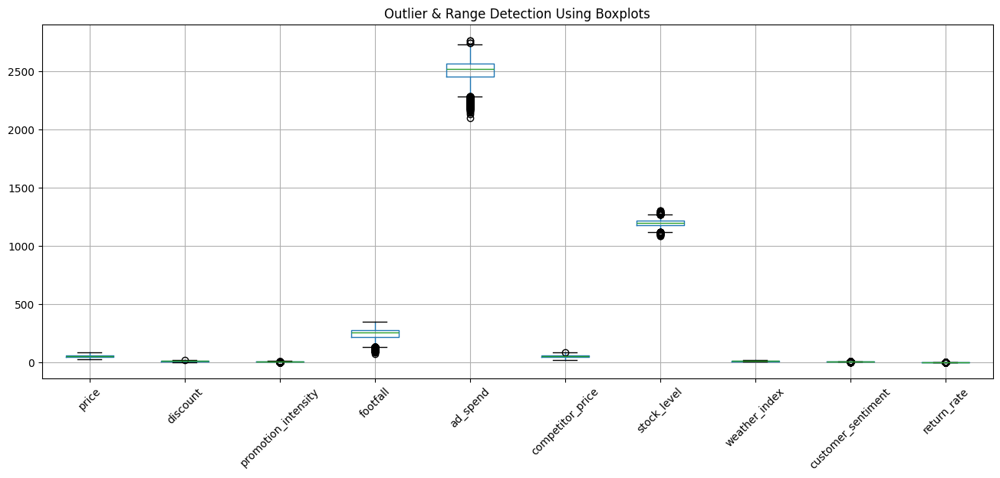

In [8]:
plt.figure(figsize=(16, 6))
df.boxplot()
plt.xticks(rotation=45)
plt.title("Outlier & Range Detection Using Boxplots")
plt.grid(True)
plt.show()

### **🔹 3. Min–Max Sanity Table (Numerical Validation)**
**🎯 Goal**

Explicitly prove no invalid values exist.

In [9]:
sanity_check = df.describe().T[['min', 'max']]
sanity_check

,min,max
price,20.212604,79.248053
discount,0.000000,18.757707
promotion_intensity,-1.049689,6.966653
footfall,70.152377,348.795219
ad_spend,2097.020336,2764.819228
competitor_price,16.656974,85.804626
stock_level,1083.677929,1301.090400
weather_index,1.889509,13.451735
customer_sentiment,-0.220674,1.347314
return_rate,0.000000,0.185994


### **🔹 4. Correlation Heatmap (Synthetic Bias Detection)**
**🎯 Goal**

**Detect:**

- Perfect or near-perfect correlations
- Linear dependency patterns

**📊 Plot: Correlation Heatmap**

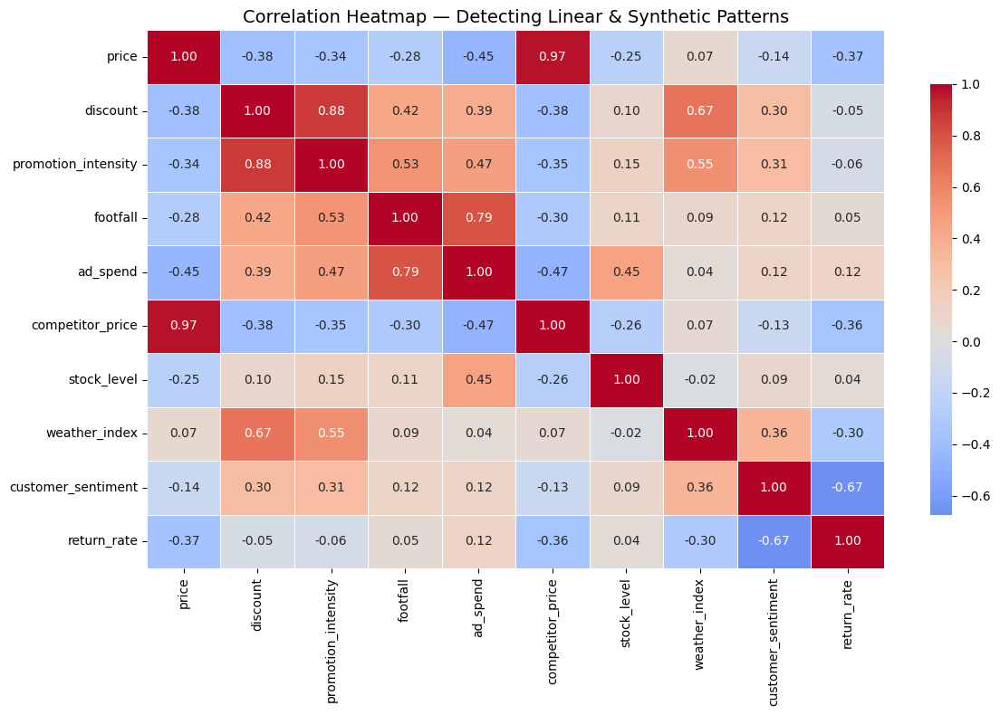

In [10]:
plt.figure(figsize=(12, 8))

corr = df.corr()

sns.heatmap(
    corr,
    annot=True,          # ✅ show values
    fmt=".2f",           # ✅ 2 decimal precision
    cmap="coolwarm",
    center=0,
    linewidths=0.5,      # optional: clearer cell separation
    cbar_kws={"shrink": 0.8}
)

plt.title("Correlation Heatmap — Detecting Linear & Synthetic Patterns", fontsize=14)
plt.tight_layout()
plt.show()


### **🔹 5. Pairwise Scatter Sampling (Visual Linearity Check)**
**🎯 Goal**

See if relationships are too perfect.

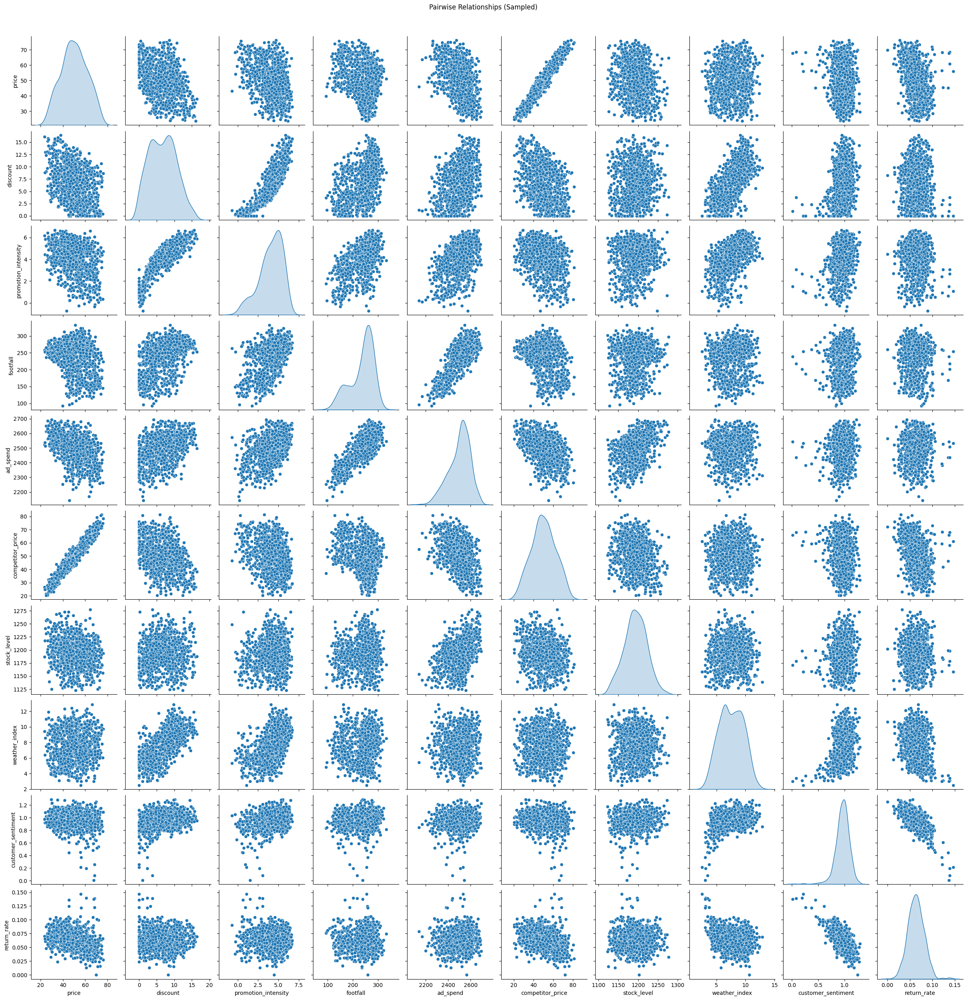

In [11]:
sample_df = df.sample(1000, random_state=42)

sns.pairplot(
    sample_df,
    diag_kind='kde'
)
plt.suptitle("Pairwise Relationships (Sampled)", y=1.02)
plt.show()

### **🔹 6. Missing Values Visualization (Proof of Clean Data)**
**🎯 Goal**

Visually confirm zero missing values.

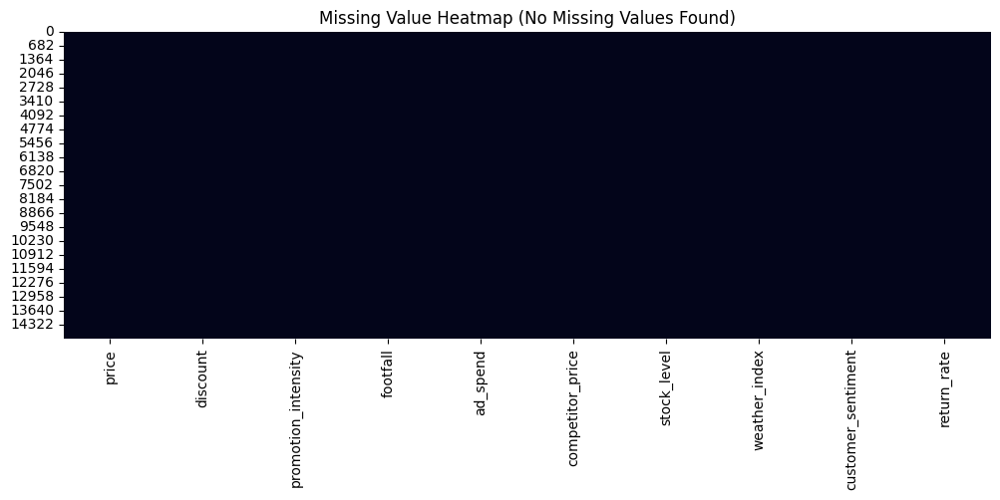

In [12]:
plt.figure(figsize=(12, 4))
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Value Heatmap (No Missing Values Found)")
plt.show()

### **🔹7. Feature Role Understanding (Control vs Outcome)**
**🎯 Goal**

Categorize features conceptually.

**📊 Plot: Correlation with Return Rate (Outcome Proxy)**

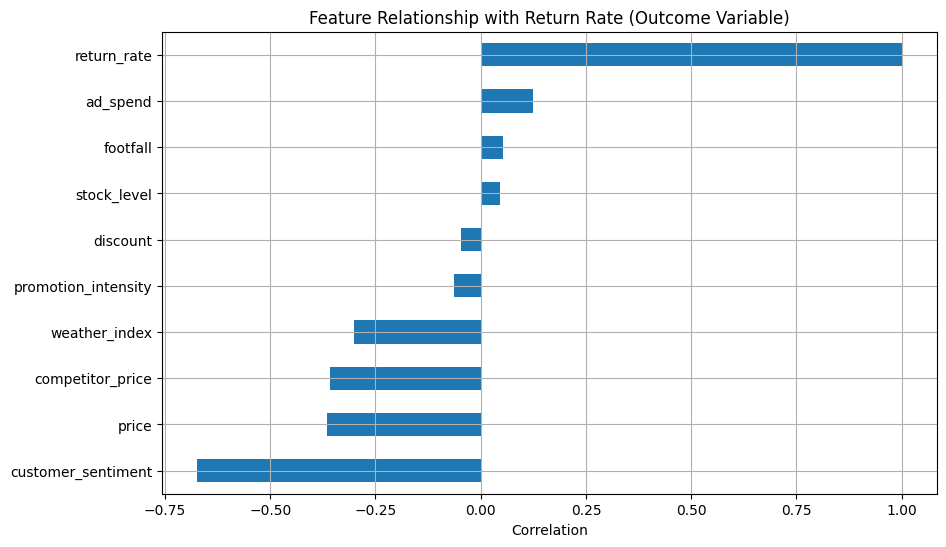

In [13]:
plt.figure(figsize=(10, 6))
df.corr()['return_rate'].sort_values().plot(kind='barh')
plt.title("Feature Relationship with Return Rate (Outcome Variable)")
plt.xlabel("Correlation")
plt.grid(True)
plt.show()

# **2️⃣ Distribution Analysis (Customer & Market Behavior)**

### **🔹 1. Price Distribution**
**🎯 Insight Goal**

Identify premium vs mass-market positioning and pricing consistency.

**📊 Plot: Histogram + KDE**

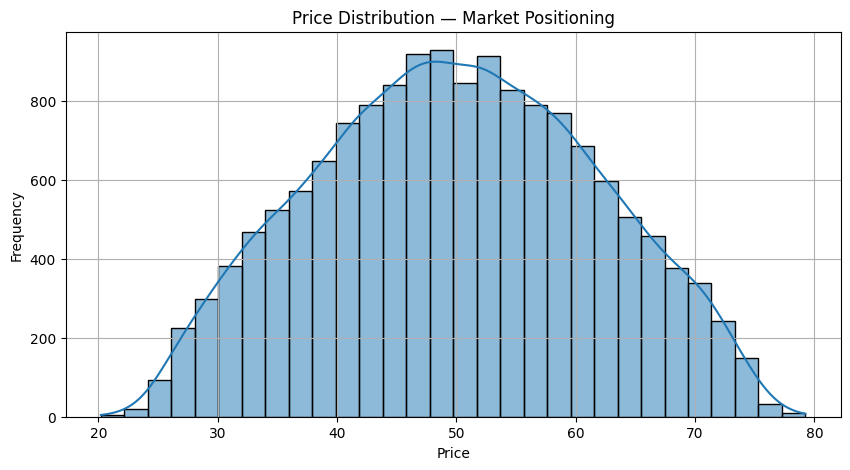

In [14]:
plt.figure(figsize=(10, 5))
sns.histplot(df['price'], bins=30, kde=True)
plt.title("Price Distribution — Market Positioning")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 2. Discount Distribution**
**🎯 Insight Goal**

Understand pricing aggressiveness.

**📊 Plot: Histogram + KDE**

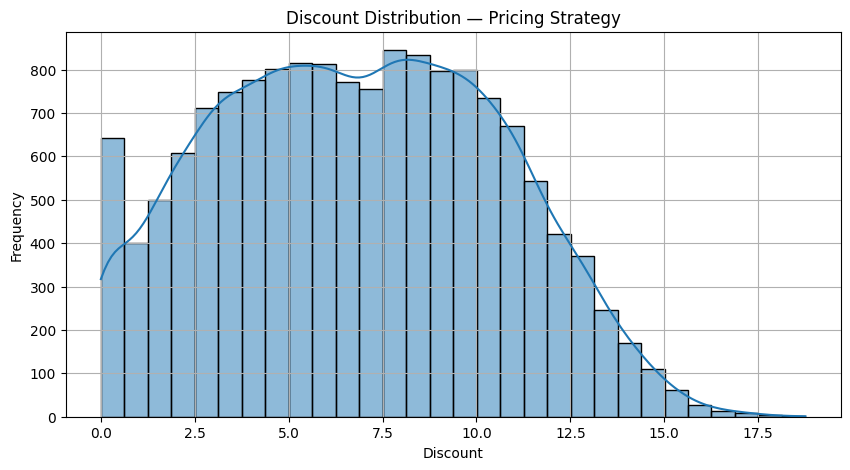

In [15]:
plt.figure(figsize=(10, 5))
sns.histplot(df['discount'], bins=30, kde=True)
plt.title("Discount Distribution — Pricing Strategy")
plt.xlabel("Discount")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 3. Footfall Distribution**
**🎯 Insight Goal**

Detect traffic stability vs volatility and possible hidden patterns.

**📊 Plot: Histogram + KDE**

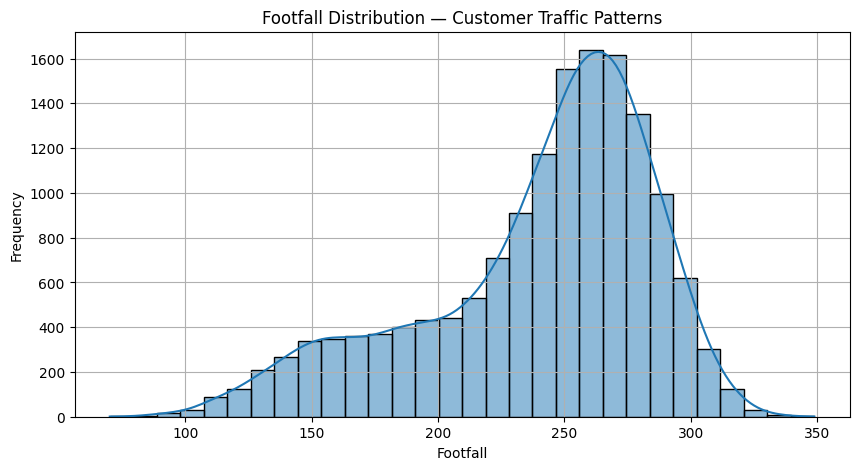

In [16]:
plt.figure(figsize=(10, 5))
sns.histplot(df['footfall'], bins=30, kde=True)
plt.title("Footfall Distribution — Customer Traffic Patterns")
plt.xlabel("Footfall")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 4. Ad Spend Distribution**
**🎯 Insight Goal**

Identify consistent marketing vs campaign spikes.

**📊 Plot: Histogram + KDE (Right-Skew Friendly)**

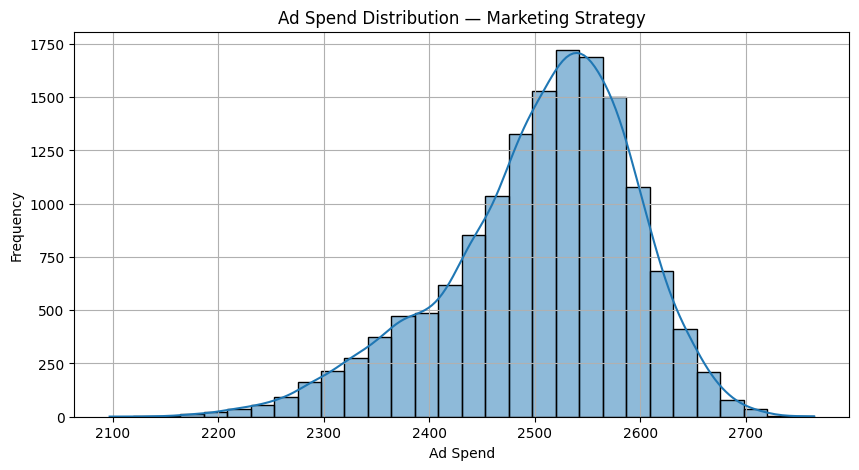

In [17]:
plt.figure(figsize=(10, 5))
sns.histplot(df['ad_spend'], bins=30, kde=True)
plt.title("Ad Spend Distribution — Marketing Strategy")
plt.xlabel("Ad Spend")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 5. Return Rate Distribution**
**🎯 Insight Goal**

Reveal customer dissatisfaction or expectation mismatch.

**📊 Plot: Histogram + KDE**

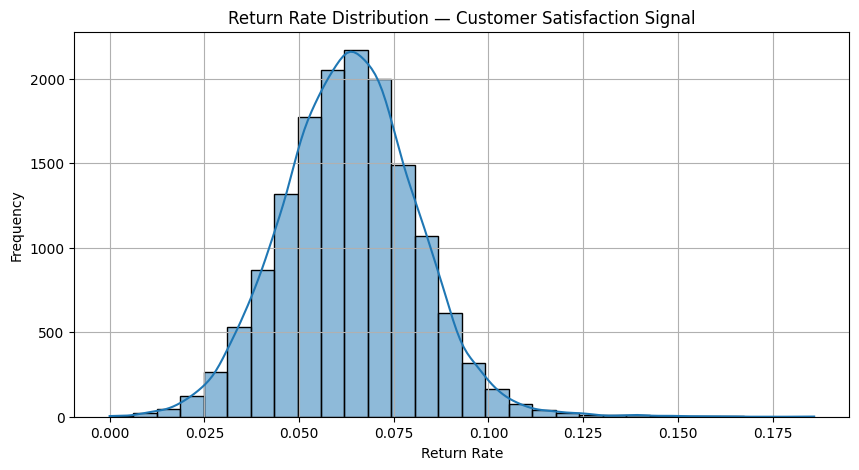

In [18]:
plt.figure(figsize=(10, 5))
sns.histplot(df['return_rate'], bins=30, kde=True)
plt.title("Return Rate Distribution — Customer Satisfaction Signal")
plt.xlabel("Return Rate")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 6. Side-by-Side Distribution Comparison (EDA Power Move)**
**🎯 Goal**

Visually compare key market drivers at once.

**📊 Plot: Boxplots (Clean Comparison)**

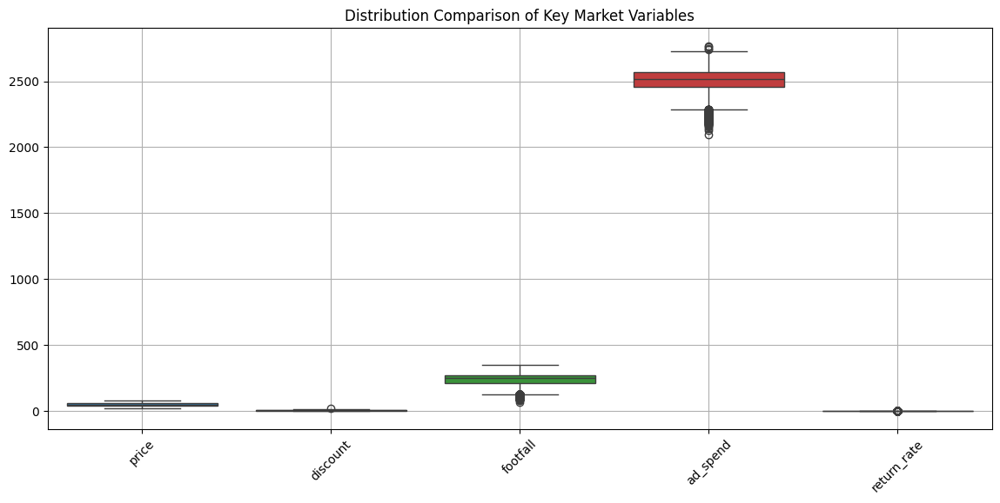

In [19]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=df[['price', 'discount', 'footfall', 'ad_spend', 'return_rate']])
plt.title("Distribution Comparison of Key Market Variables")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# **3️⃣ Pricing & Discount Dynamics (Revenue Strategy)**

### **🔹 1. Price ↔ Footfall Relationship**
**🎯 Goal**

Understand price sensitivity and demand elasticity.

**📊 Plot: Scatter + Trend Line**

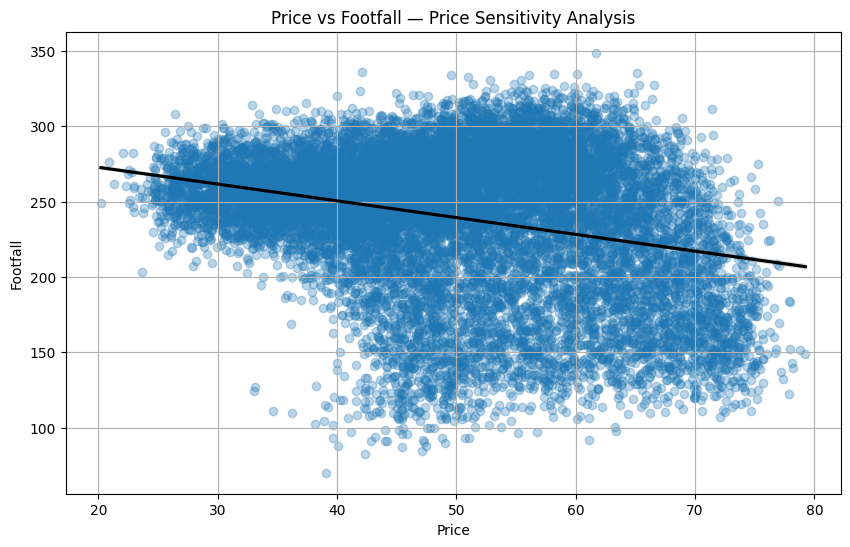

In [20]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='price',
    y='footfall',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Price vs Footfall — Price Sensitivity Analysis")
plt.xlabel("Price")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 2. Discount ↔ Footfall Impact**
**🎯 Goal**

Measure how effective discounts are in driving traffic.

**📊 Plot: Scatter + LOWESS Smoother**

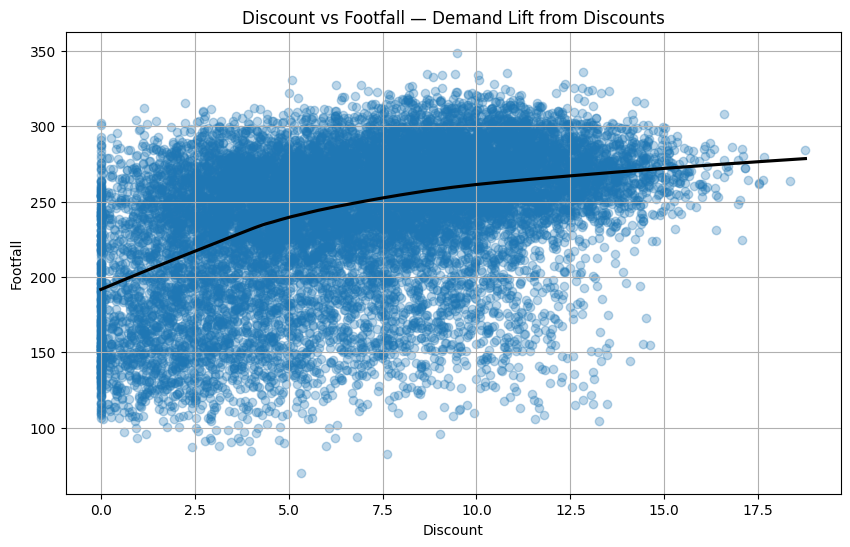

In [21]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='discount',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Discount vs Footfall — Demand Lift from Discounts")
plt.xlabel("Discount")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 3. Discount Threshold Analysis (Footfall Jump)**
**🎯 Goal**

Identify critical discount levels where demand changes sharply.

**📊 Plot: Binned Discount vs Mean Footfall**

/tmp/ipykernel_18/410255125.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  discount_threshold = df.groupby('discount_bin')['footfall'].mean()


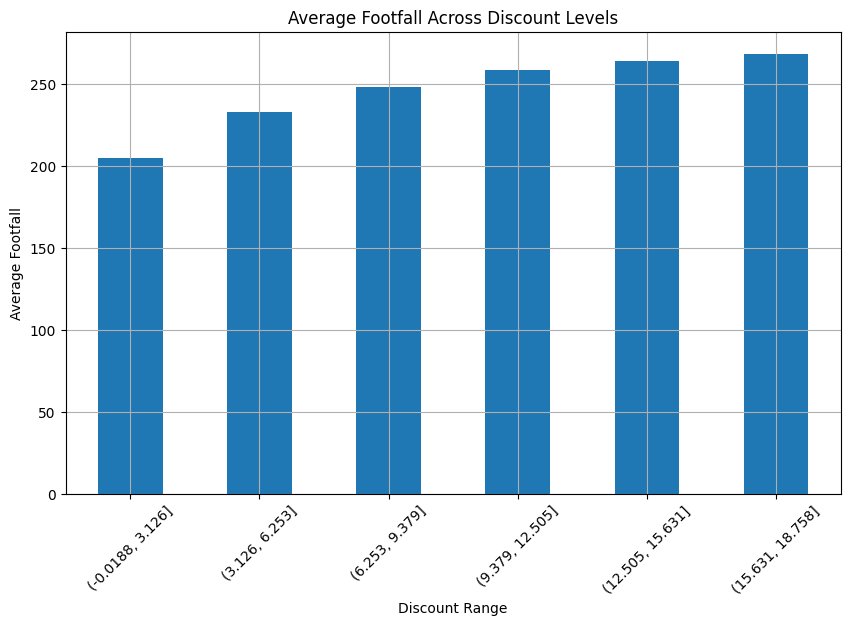

In [22]:
df['discount_bin'] = pd.cut(df['discount'], bins=6)

discount_threshold = df.groupby('discount_bin')['footfall'].mean()

plt.figure(figsize=(10, 6))
discount_threshold.plot(kind='bar')
plt.title("Average Footfall Across Discount Levels")
plt.xlabel("Discount Range")
plt.ylabel("Average Footfall")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

### **🔹 4. Combined Effect: Price + Discount on Footfall**
**🎯 Goal**

Understand interaction effects, not isolated ones.

**📊 Plot: Bubble Scatter (Advanced EDA Look)**

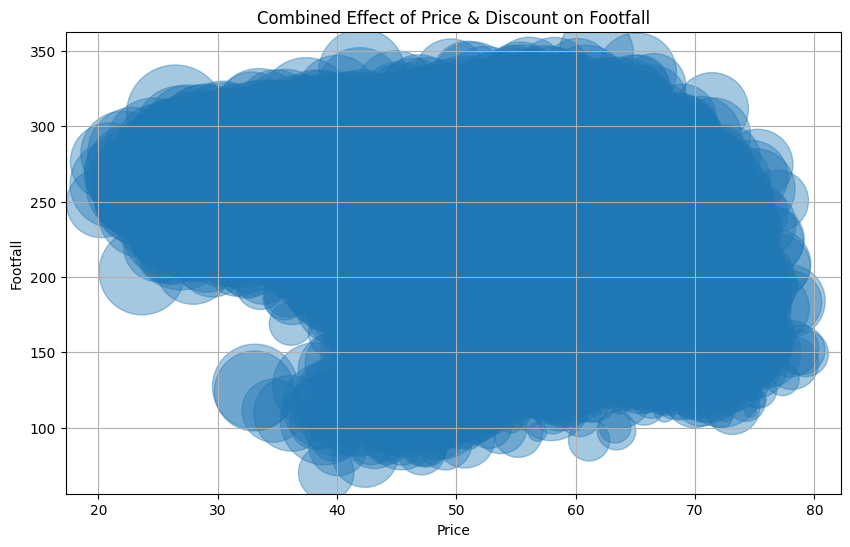

In [23]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['price'],
    df['footfall'],
    s=df['discount'] * 300,   # bubble size = discount
    alpha=0.4
)
plt.xlabel("Price")
plt.ylabel("Footfall")
plt.title("Combined Effect of Price & Discount on Footfall")
plt.grid(True)
plt.show()

### **🔹 5. Does Discount Compensate for High Prices?**
**🎯 Goal**

Directly compare pricing strategies.

**📊 Plot: Price Segments × Discount Levels**

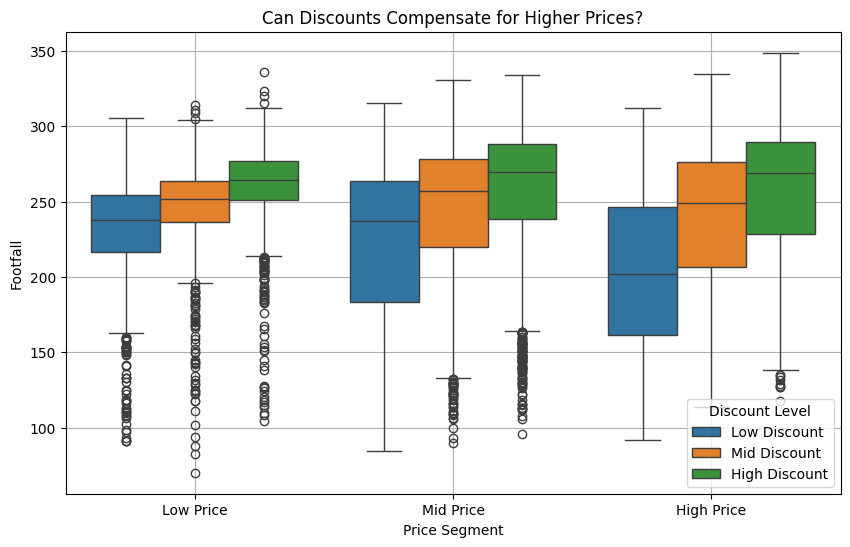

In [24]:
df['price_segment'] = pd.qcut(df['price'], q=3, labels=['Low Price', 'Mid Price', 'High Price'])

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='price_segment',
    y='footfall',
    hue=pd.qcut(df['discount'], q=3, labels=['Low Discount', 'Mid Discount', 'High Discount']),
    data=df
)
plt.title("Can Discounts Compensate for Higher Prices?")
plt.xlabel("Price Segment")
plt.ylabel("Footfall")
plt.legend(title="Discount Level")
plt.grid(True)
plt.show()

# **4️⃣ Promotion & Advertising Effectiveness**

### **🔹 1. Promotion Intensity vs Footfall (Non-Linear Effect)**
🎯 Goal**
**
Check whether promotions scale linearly or show diminishing / accelerating returns.

**📊 Plot: Scatter + LOWESS Curve**

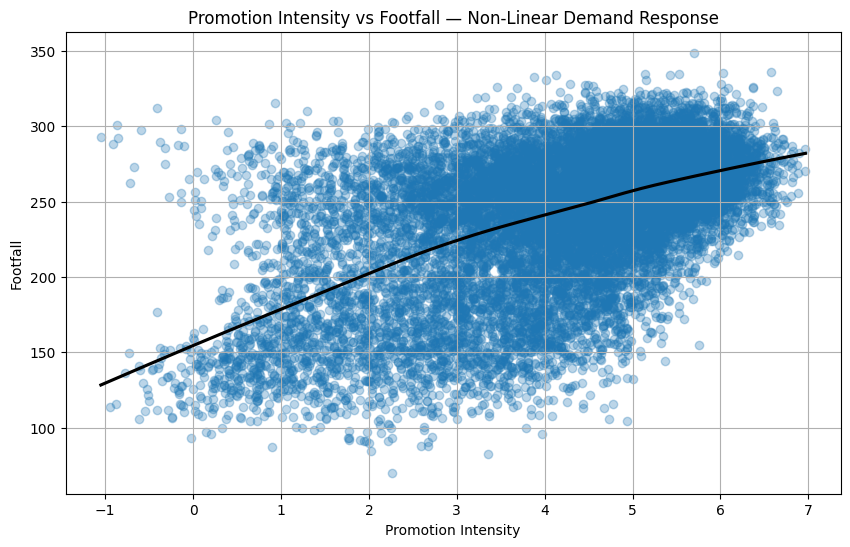

In [25]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='promotion_intensity',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Promotion Intensity vs Footfall — Non-Linear Demand Response")
plt.xlabel("Promotion Intensity")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 2. Ad Spend vs Footfall (Diminishing Returns Test)**
**🎯 Goal**

Identify ROI efficiency of marketing spend.

**📊 Plot: Scatter + LOWESS**

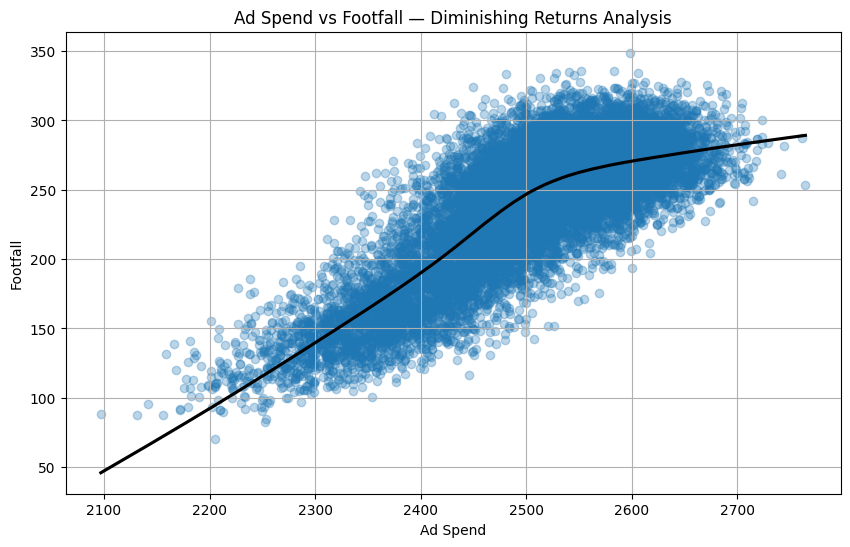

In [26]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='ad_spend',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Ad Spend vs Footfall — Diminishing Returns Analysis")
plt.xlabel("Ad Spend")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 3. Ad Spend vs Customer Sentiment**
**🎯 Goal**

Understand whether advertising improves customer perception, not just traffic.

**📊 Plot: Scatter + Trend Line**

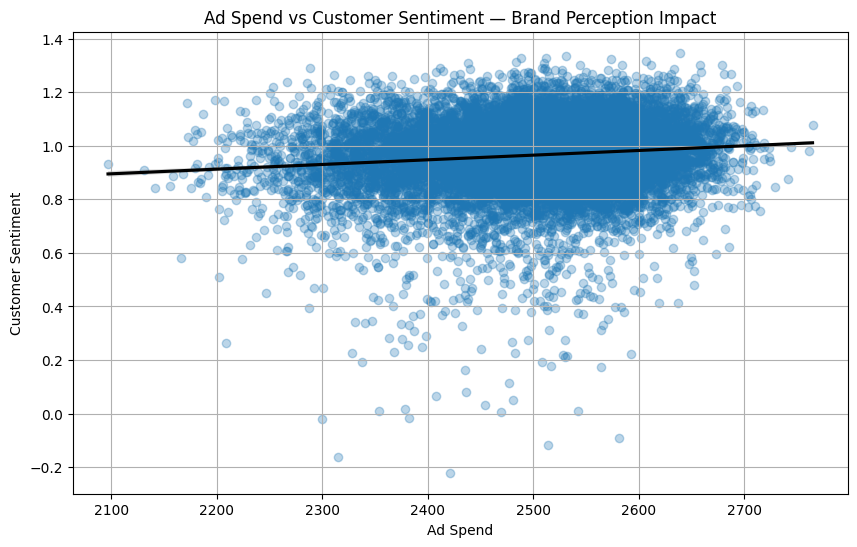

In [27]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='ad_spend',
    y='customer_sentiment',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Ad Spend vs Customer Sentiment — Brand Perception Impact")
plt.xlabel("Ad Spend")
plt.ylabel("Customer Sentiment")
plt.grid(True)
plt.show()

### **🔹 4. Promotion Effectiveness Under Different Pricing Levels**
**🎯 Goal**

Check if promotions work better for expensive products.

**📊 Plot: Promotion × Price Segments vs Footfall**

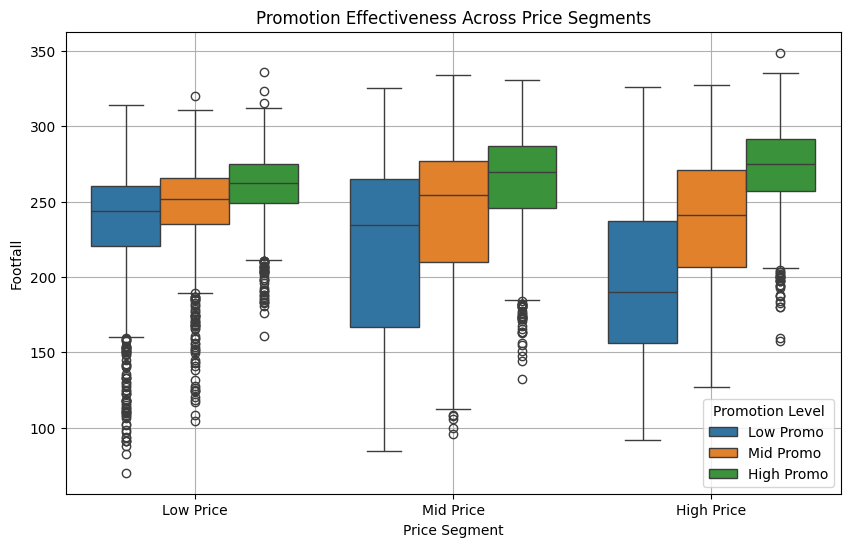

In [28]:
df['price_segment'] = pd.qcut(
    df['price'],
    q=3,
    labels=['Low Price', 'Mid Price', 'High Price']
)

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='price_segment',
    y='footfall',
    hue=pd.qcut(df['promotion_intensity'], q=3,
                labels=['Low Promo', 'Mid Promo', 'High Promo']),
    data=df
)
plt.title("Promotion Effectiveness Across Price Segments")
plt.xlabel("Price Segment")
plt.ylabel("Footfall")
plt.legend(title="Promotion Level")
plt.grid(True)
plt.show()

### **🔹 5. Promotion ROI Check (Ad Spend × Promotion)**
**🎯 Goal**

Detect wasted ad spend without promotions.

**📊 Plot: Bubble Chart (EDA Power Move)**

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


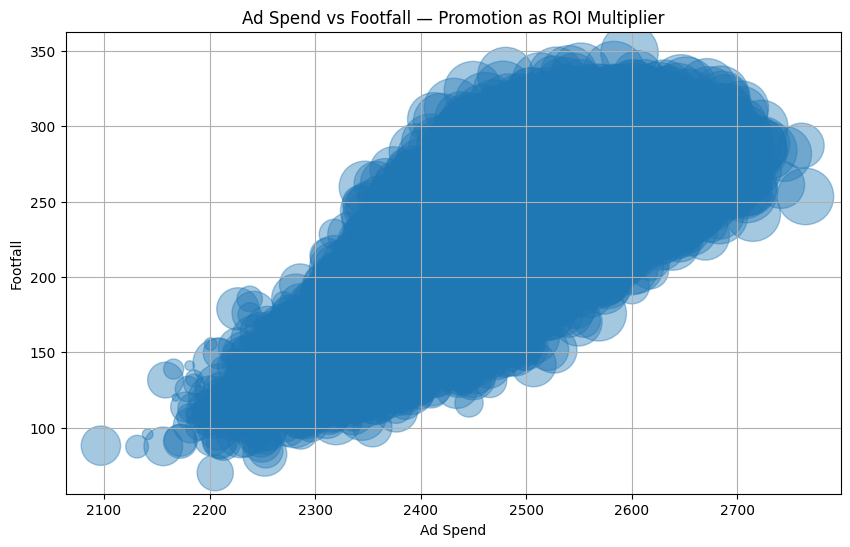

In [29]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['ad_spend'],
    df['footfall'],
    s=df['promotion_intensity'] * 300,
    alpha=0.4
)
plt.xlabel("Ad Spend")
plt.ylabel("Footfall")
plt.title("Ad Spend vs Footfall — Promotion as ROI Multiplier")
plt.grid(True)
plt.show()

# **5️⃣ Competitive Positioning Insights**

### **🔹 1. Price Gap Analysis (Our Price − Competitor Price)**
**🎯 Goal**

Quantify how much cheaper or more expensive we are.

**📊 Plot: Price Gap Distribution**

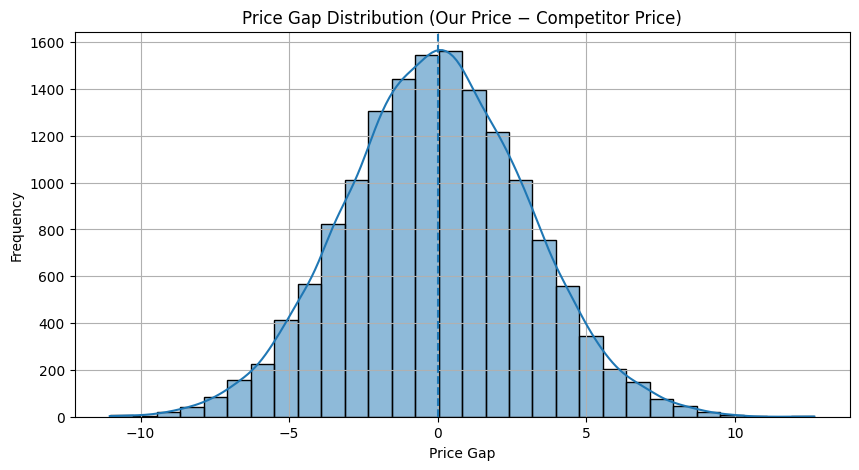

In [30]:
df['price_gap'] = df['price'] - df['competitor_price']

plt.figure(figsize=(10, 5))
sns.histplot(df['price_gap'], bins=30, kde=True)
plt.axvline(0, linestyle='--')
plt.title("Price Gap Distribution (Our Price − Competitor Price)")
plt.xlabel("Price Gap")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 2. Competitor Price vs Footfall**
**🎯 Goal**

See whether competitor pricing affects our demand.

**📊 Plot: Scatter + LOWESS**

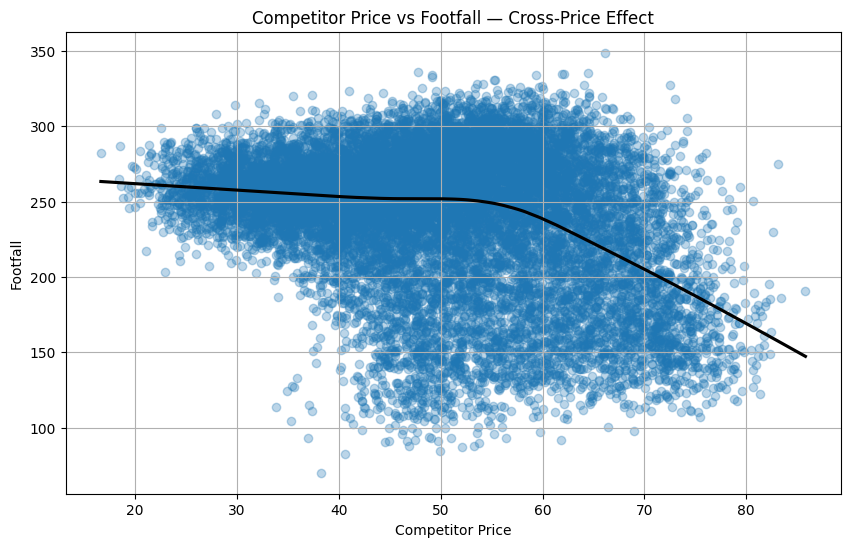

In [31]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='competitor_price',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Competitor Price vs Footfall — Cross-Price Effect")
plt.xlabel("Competitor Price")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 3. Price Gap vs Footfall (Critical Plot)**
**🎯 Goal**

Identify undercutting thresholds.

**📊 Plot: LOWESS Curve**

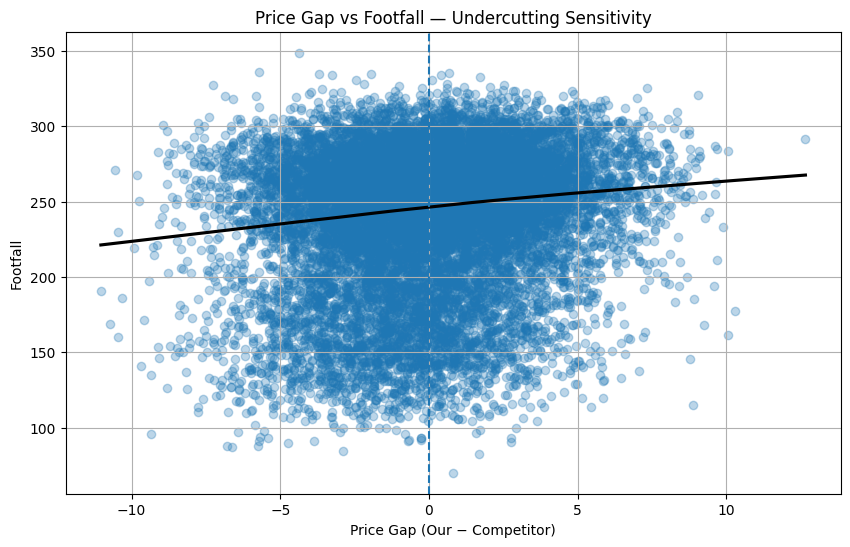

In [32]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='price_gap',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.axvline(0, linestyle='--')
plt.title("Price Gap vs Footfall — Undercutting Sensitivity")
plt.xlabel("Price Gap (Our − Competitor)")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 4. Competitive Scenarios: Cheaper vs More Expensive**
**🎯 Goal**

Compare head-to-head pricing scenarios.

**📊 Plot: Scenario-Based Boxplot**

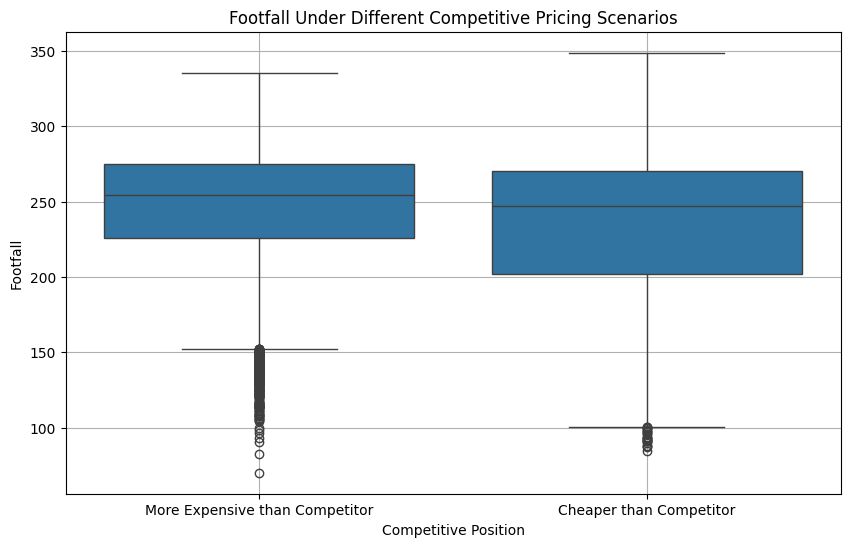

In [33]:
df['competitive_position'] = np.where(
    df['price'] < df['competitor_price'],
    'Cheaper than Competitor',
    'More Expensive than Competitor'
)

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='competitive_position',
    y='footfall',
    data=df
)
plt.title("Footfall Under Different Competitive Pricing Scenarios")
plt.xlabel("Competitive Position")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 5. Promotions as a Defense Against Higher Competitor Prices**
**🎯 Goal**

Test whether promotions protect us when competitor is cheaper.

**📊 Plot: Price Gap × Promotion Intensity**

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


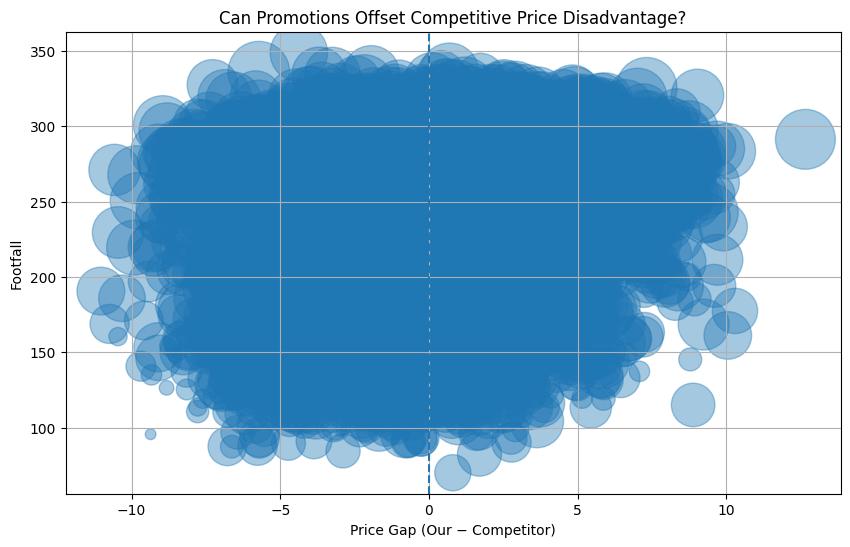

In [34]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['price_gap'],
    df['footfall'],
    s=df['promotion_intensity'] * 300,
    alpha=0.4
)
plt.axvline(0, linestyle='--')
plt.xlabel("Price Gap (Our − Competitor)")
plt.ylabel("Footfall")
plt.title("Can Promotions Offset Competitive Price Disadvantage?")
plt.grid(True)
plt.show()

# **6️⃣ Inventory & Stock Level Intelligence**

### **🔹 1. Stock Level vs Footfall (Mismatch Detection)**
**🎯 Goal**

Detect lost sales risk and demand–supply misalignment.

**📊 Plot: Scatter + LOWESS**

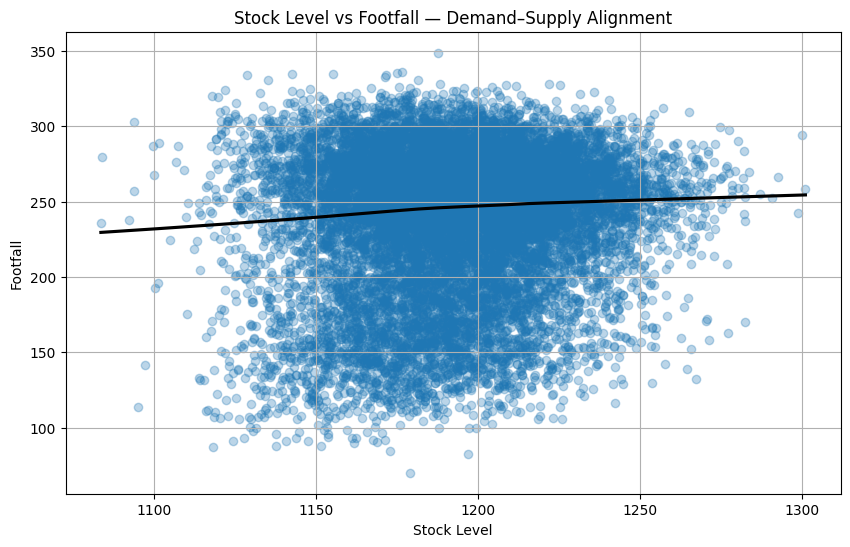

In [35]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='stock_level',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Stock Level vs Footfall — Demand–Supply Alignment")
plt.xlabel("Stock Level")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 2. Over-Stocking vs Stock-Out Scenarios**
**🎯 Goal**

Explicitly label operational risk zones.

**📊 Plot: Quadrant Scatter (EDA Power Move)**

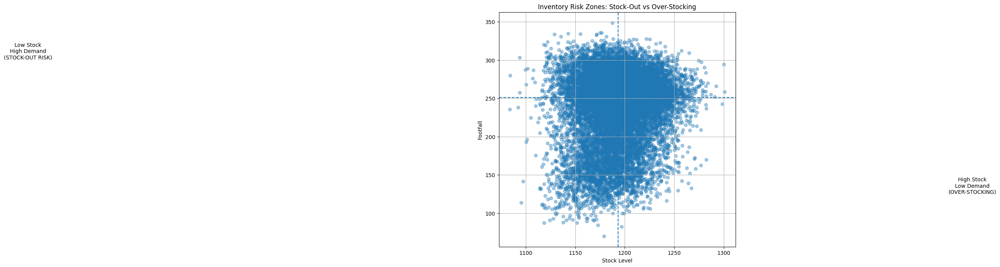

In [36]:
# Define thresholds
stock_median = df['stock_level'].median()
footfall_median = df['footfall'].median()

plt.figure(figsize=(8, 8))
plt.scatter(df['stock_level'], df['footfall'], alpha=0.4)

plt.axvline(stock_median, linestyle='--')
plt.axhline(footfall_median, linestyle='--')

plt.text(stock_median*0.5, footfall_median*1.2, "Low Stock\nHigh Demand\n(STOCK-OUT RISK)", ha='center')
plt.text(stock_median*1.3, footfall_median*0.5, "High Stock\nLow Demand\n(OVER-STOCKING)", ha='center')

plt.xlabel("Stock Level")
plt.ylabel("Footfall")
plt.title("Inventory Risk Zones: Stock-Out vs Over-Stocking")
plt.grid(True)
plt.show()

### **🔹 3. Distribution of Stock Levels**
**🎯 Goal**

Understand inventory strategy.

**📊 Plot: Histogram + KDE**

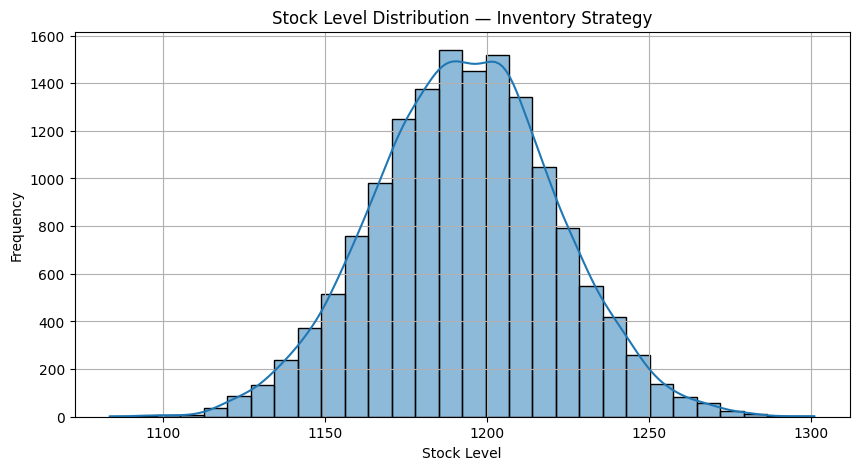

In [37]:
plt.figure(figsize=(10, 5))
sns.histplot(df['stock_level'], bins=30, kde=True)
plt.title("Stock Level Distribution — Inventory Strategy")
plt.xlabel("Stock Level")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 4. Return Rate vs Stock Level**
**🎯 Goal**

Identify quality issues or impulse buying behavior.

**📊 Plot: Scatter + Trend Line**

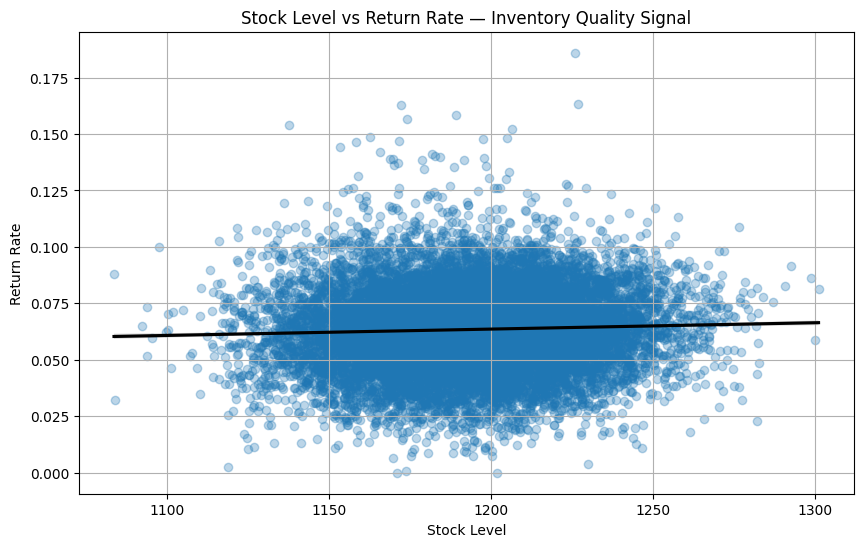

In [38]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='stock_level',
    y='return_rate',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Stock Level vs Return Rate — Inventory Quality Signal")
plt.xlabel("Stock Level")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 5. Stock Efficiency Under High Footfall**
**🎯 Goal**

Check whether inventory scales with demand.

**📊 Plot: Bubble Chart (Advanced EDA Look)**

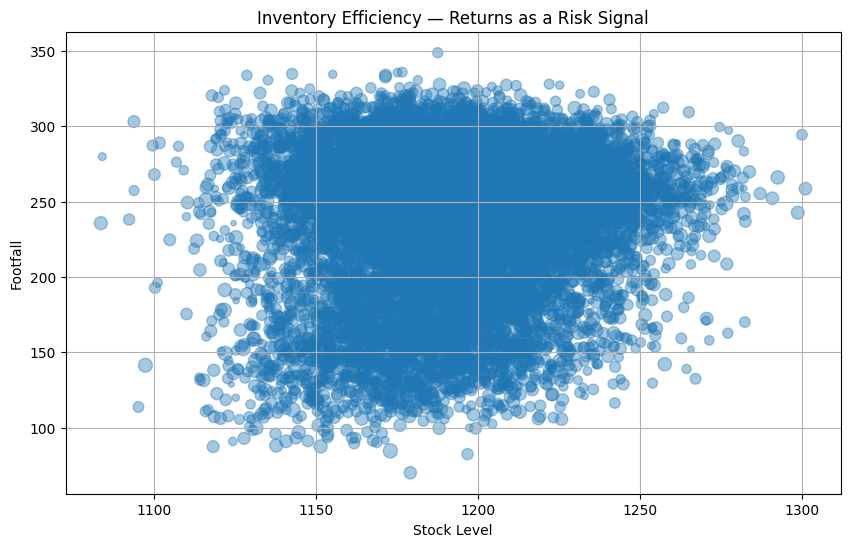

In [39]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['stock_level'],
    df['footfall'],
    s=df['return_rate'] * 1000,
    alpha=0.4
)
plt.xlabel("Stock Level")
plt.ylabel("Footfall")
plt.title("Inventory Efficiency — Returns as a Risk Signal")
plt.grid(True)
plt.show()

### **🔹 6. Stock Segments vs Average Footfall**
**🎯 Goal**

Summarize inventory effectiveness clearly.

**📊 Plot: Binned Stock Levels**

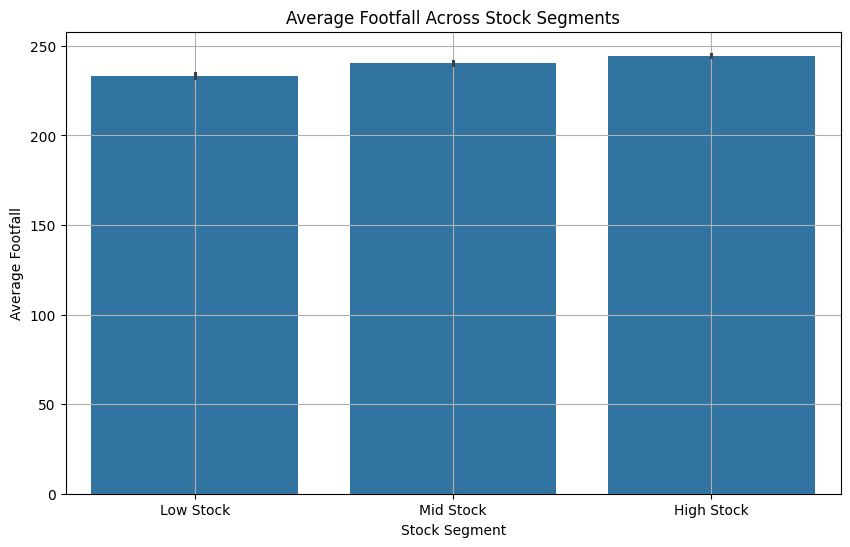

In [40]:
df['stock_segment'] = pd.qcut(df['stock_level'], q=3, labels=['Low Stock', 'Mid Stock', 'High Stock'])

plt.figure(figsize=(10, 6))
sns.barplot(
    x='stock_segment',
    y='footfall',
    data=df
)
plt.title("Average Footfall Across Stock Segments")
plt.xlabel("Stock Segment")
plt.ylabel("Average Footfall")
plt.grid(True)
plt.show()

# **7️⃣ Customer Sentiment & Experience**

### **🔹 1. Customer Sentiment vs Return Rate (Most Important)**
**🎯 Goal**

Prove whether bad experience → higher returns.

**📊 Plot: Scatter + Trend Line**

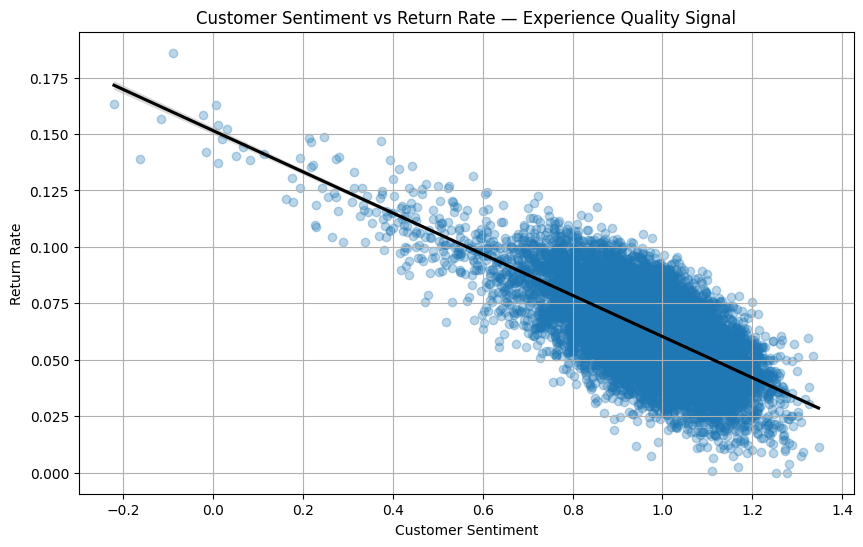

In [41]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='customer_sentiment',
    y='return_rate',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Customer Sentiment vs Return Rate — Experience Quality Signal")
plt.xlabel("Customer Sentiment")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 2. Sentiment vs Discount (Cheap ≠ Satisfaction)**
**🎯 Goal**

Test whether discounts actually make customers happier.

**📊 Plot: Scatter + LOWESS**

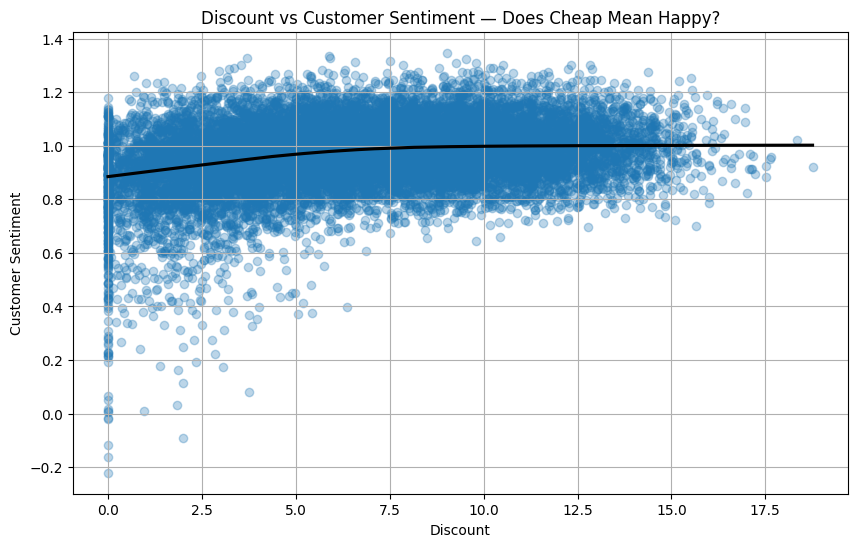

In [42]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='discount',
    y='customer_sentiment',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Discount vs Customer Sentiment — Does Cheap Mean Happy?")
plt.xlabel("Discount")
plt.ylabel("Customer Sentiment")
plt.grid(True)
plt.show()

### **🔹 3. Sentiment vs Promotion Intensity**
**🎯 Goal**

Understand whether aggressive promotions dilute brand experience.

**📊 Plot: Scatter + LOWESS**

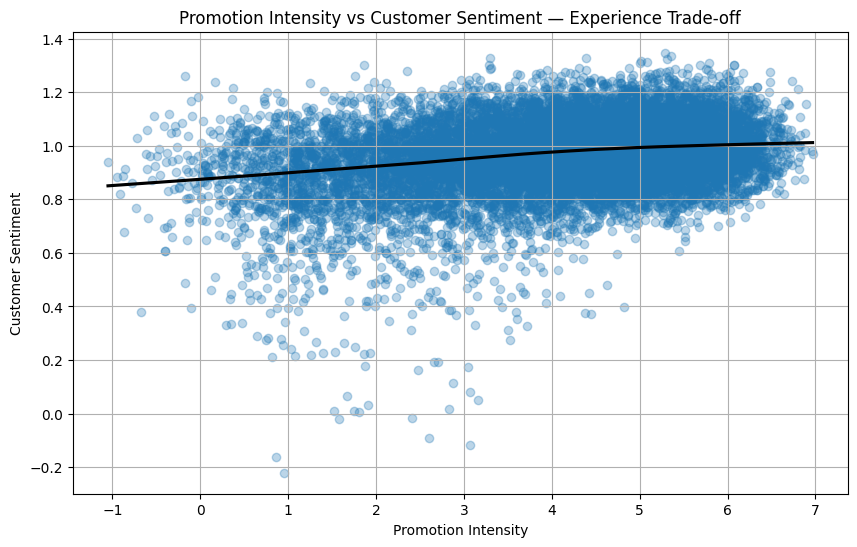

In [43]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='promotion_intensity',
    y='customer_sentiment',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Promotion Intensity vs Customer Sentiment — Experience Trade-off")
plt.xlabel("Promotion Intensity")
plt.ylabel("Customer Sentiment")
plt.grid(True)
plt.show()

### **🔹 4. Sentiment as a Mediator Between Price and Returns**
**🎯 Goal**

Reveal why high prices cause returns — not directly, but via sentiment.

**📊 Plot: Bubble Chart (Advanced EDA Move)**

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


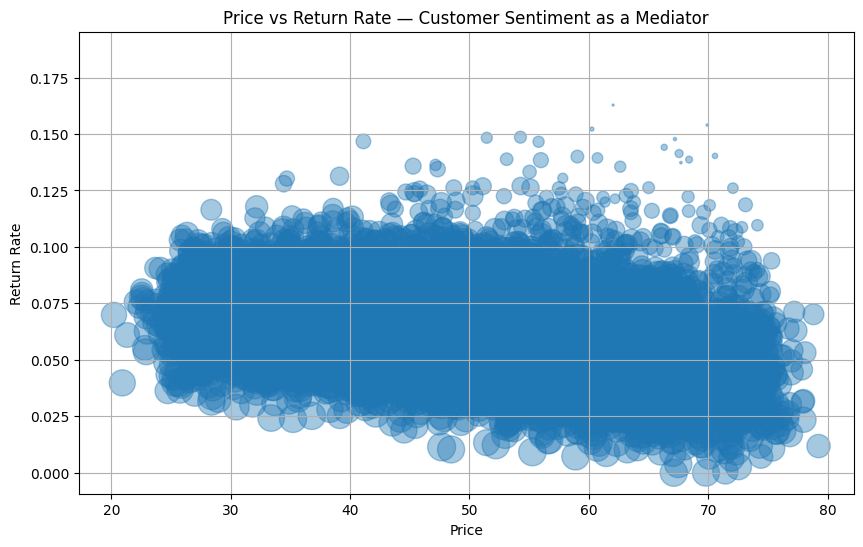

In [44]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['price'],
    df['return_rate'],
    s=df['customer_sentiment'] * 300,
    alpha=0.4
)
plt.xlabel("Price")
plt.ylabel("Return Rate")
plt.title("Price vs Return Rate — Customer Sentiment as a Mediator")
plt.grid(True)
plt.show()

### **🔹 5. Sentiment Segments vs Return Rate (Clear Summary)**
**🎯 Goal**

Convert sentiment into actionable categories.

**📊 Plot: Sentiment Segmentation**

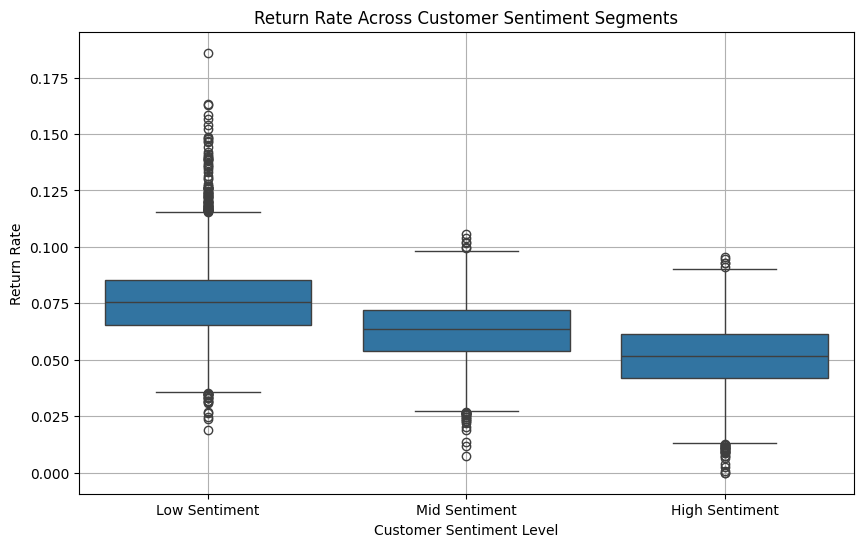

In [45]:
df['sentiment_segment'] = pd.qcut(
    df['customer_sentiment'],
    q=3,
    labels=['Low Sentiment', 'Mid Sentiment', 'High Sentiment']
)

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='sentiment_segment',
    y='return_rate',
    data=df
)
plt.title("Return Rate Across Customer Sentiment Segments")
plt.xlabel("Customer Sentiment Level")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 6. Sentiment vs Footfall (Optional but Powerful)**
**🎯 Goal**

Check whether traffic ≠ satisfaction.

**📊 Plot: Scatter**

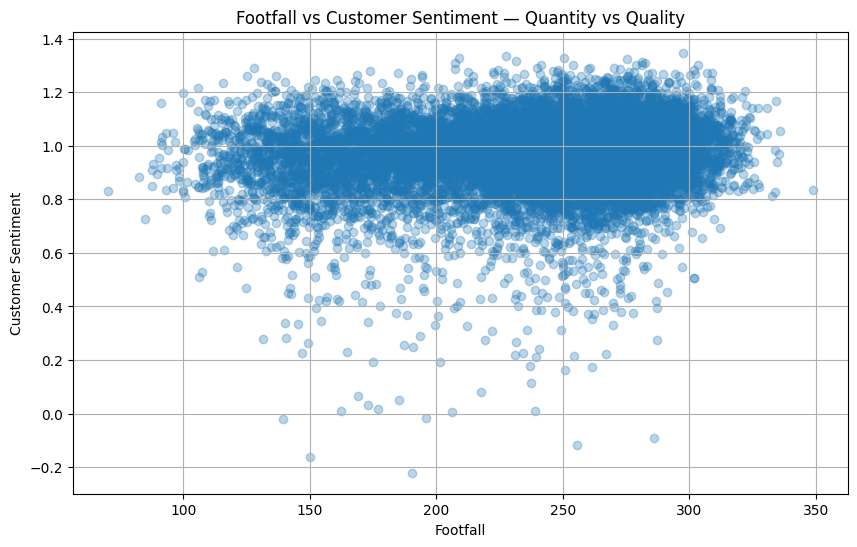

In [46]:
plt.figure(figsize=(10, 6))
plt.scatter(df['footfall'], df['customer_sentiment'], alpha=0.3)
plt.xlabel("Footfall")
plt.ylabel("Customer Sentiment")
plt.title("Footfall vs Customer Sentiment — Quantity vs Quality")
plt.grid(True)
plt.show()

# **8️⃣ Weather Impact on Sales (Contextual Demand)**

### **🔹 1. Weather Index vs Footfall**
**🎯 Goal**

Understand whether weather conditions influence store visits.

**📊 Plot: Scatter + LOWESS**

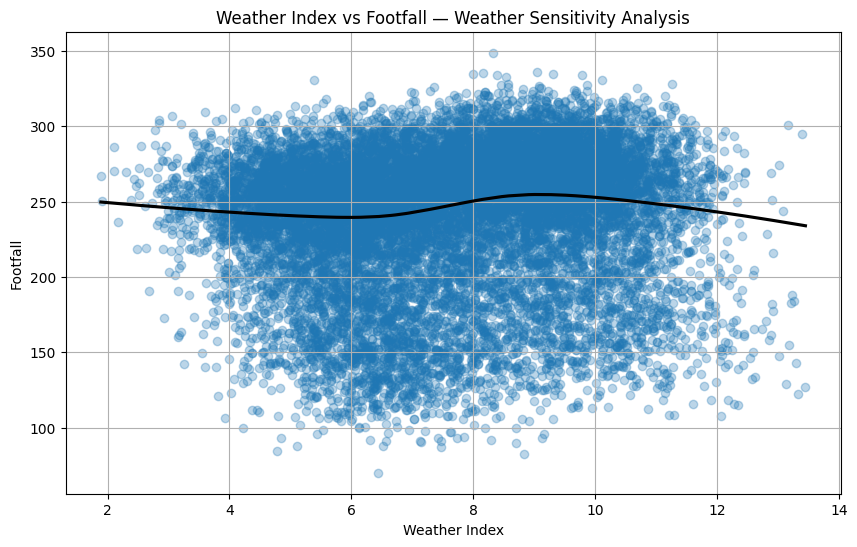

In [47]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='weather_index',
    y='footfall',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Weather Index vs Footfall — Weather Sensitivity Analysis")
plt.xlabel("Weather Index")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **🔹 2. Weather Segments vs Average Footfall**
**🎯 Goal**

Convert weather into interpretable regimes.

**📊 Plot: Binned Weather Analysis**

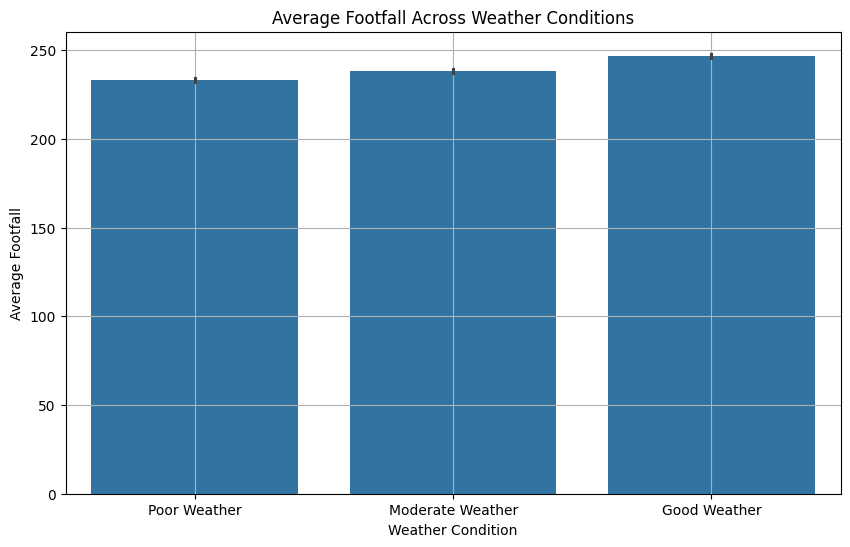

In [48]:
df['weather_segment'] = pd.qcut(
    df['weather_index'],
    q=3,
    labels=['Poor Weather', 'Moderate Weather', 'Good Weather']
)

plt.figure(figsize=(10, 6))
sns.barplot(
    x='weather_segment',
    y='footfall',
    data=df
)
plt.title("Average Footfall Across Weather Conditions")
plt.xlabel("Weather Condition")
plt.ylabel("Average Footfall")
plt.grid(True)
plt.show()

### **🔹 3. Weather vs Discount Effectiveness**
**🎯 Goal**

Test whether discounts compensate for bad weather.

**📊 Plot: Weather × Discount → Footfall**

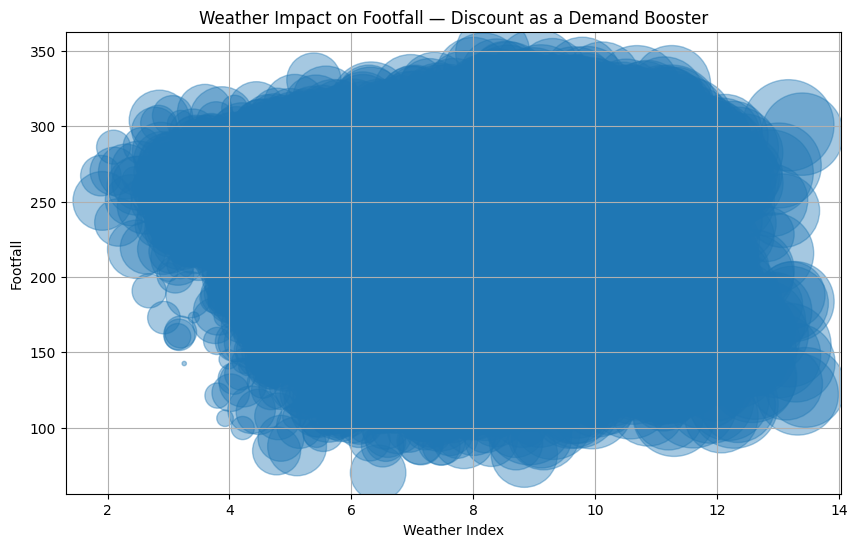

In [49]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['weather_index'],
    df['footfall'],
    s=df['discount'] * 300,
    alpha=0.4
)
plt.xlabel("Weather Index")
plt.ylabel("Footfall")
plt.title("Weather Impact on Footfall — Discount as a Demand Booster")
plt.grid(True)
plt.show()

### **🔹 4. Weather × Promotion Intensity Interaction**
**🎯 Goal**

Check whether promotions reduce weather sensitivity.

**📊 Plot: Promotion Segments Under Weather Conditions**

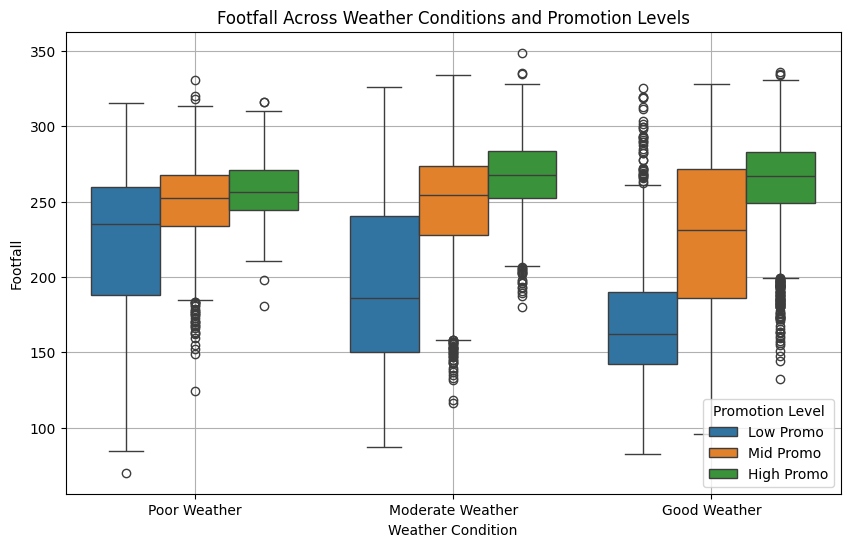

In [50]:
df['promo_segment'] = pd.qcut(
    df['promotion_intensity'],
    q=3,
    labels=['Low Promo', 'Mid Promo', 'High Promo']
)

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='weather_segment',
    y='footfall',
    hue='promo_segment',
    data=df
)
plt.title("Footfall Across Weather Conditions and Promotion Levels")
plt.xlabel("Weather Condition")
plt.ylabel("Footfall")
plt.legend(title="Promotion Level")
plt.grid(True)
plt.show()

### **🔹 5. Weather-Adjusted Demand (Advanced EDA)**
**🎯 Goal**

Separate natural demand from promotion-driven demand.

**📊 Plot: Residual Demand Concept**

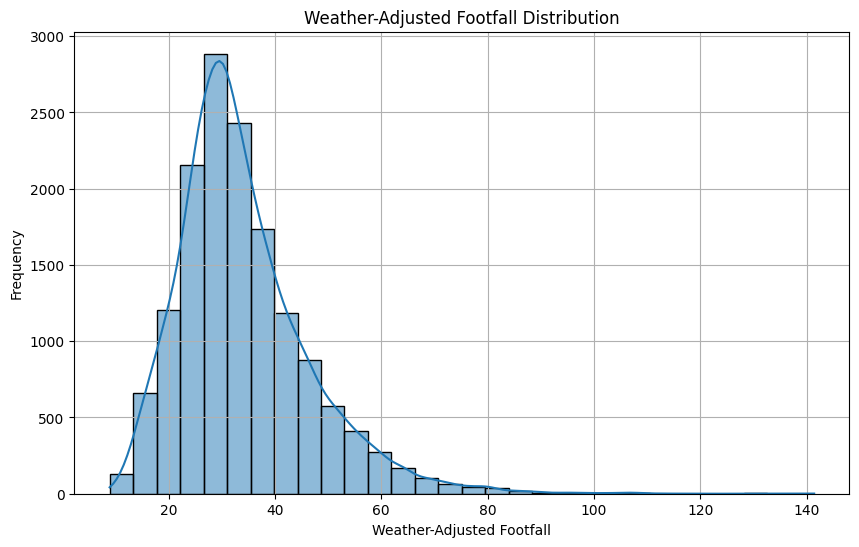

In [51]:
# Simple weather-adjusted demand proxy
df['weather_adjusted_footfall'] = df['footfall'] / df['weather_index']

plt.figure(figsize=(10, 6))
sns.histplot(df['weather_adjusted_footfall'], bins=30, kde=True)
plt.title("Weather-Adjusted Footfall Distribution")
plt.xlabel("Weather-Adjusted Footfall")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

### **🔹 6. Weather Sensitivity Under High Promotions (Elite Plot)**
**🎯 Goal**

Visually prove promotions dampen weather effects.

**📊 Plot: Weather vs Footfall (High Promo Only)**

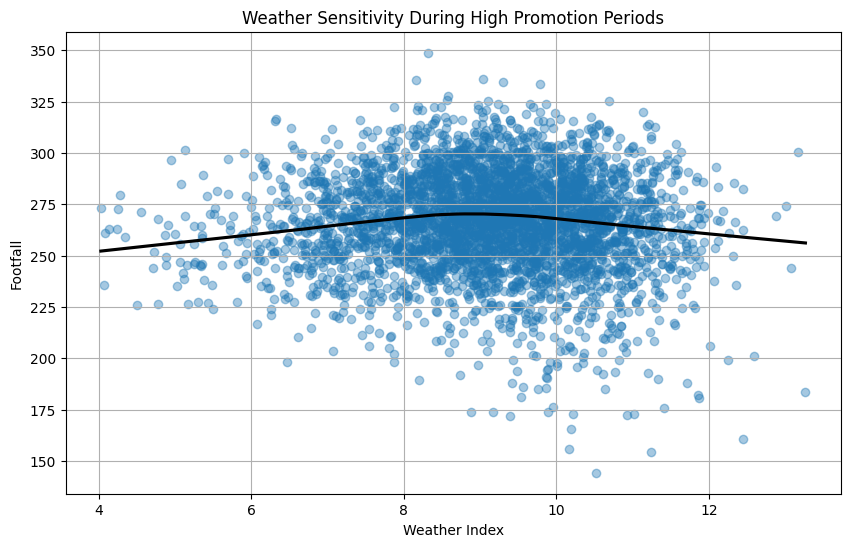

In [52]:
high_promo_df = df[df['promotion_intensity'] > df['promotion_intensity'].quantile(0.75)]

plt.figure(figsize=(10, 6))
sns.regplot(
    x='weather_index',
    y='footfall',
    data=high_promo_df,
    lowess=True,
    scatter_kws={'alpha': 0.4},
    line_kws={'color': 'black'}
)
plt.title("Weather Sensitivity During High Promotion Periods")
plt.xlabel("Weather Index")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

# **9️⃣ Return Rate Analysis (Hidden Losses)**

### **🔹 1. Return Rate vs Discount (Impulse Purchases)**
**🎯 Goal**

Check if discount-driven purchases lead to more returns.

**📊 Plot: Scatter + LOWESS**

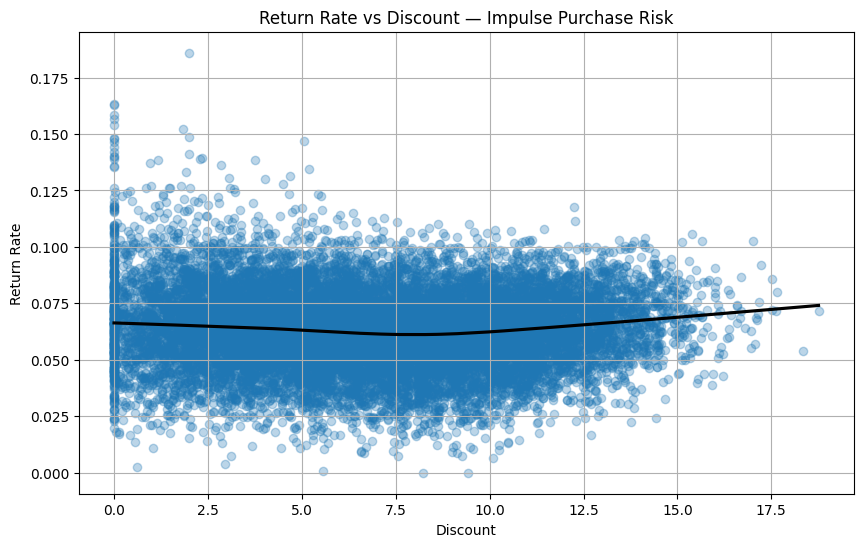

In [53]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='discount',
    y='return_rate',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Return Rate vs Discount — Impulse Purchase Risk")
plt.xlabel("Discount")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 2. Return Rate vs Customer Sentiment (Strongest Predictor)**
**🎯 Goal**

Validate that low sentiment drives returns.

**📊 Plot: Scatter + Trend Line**

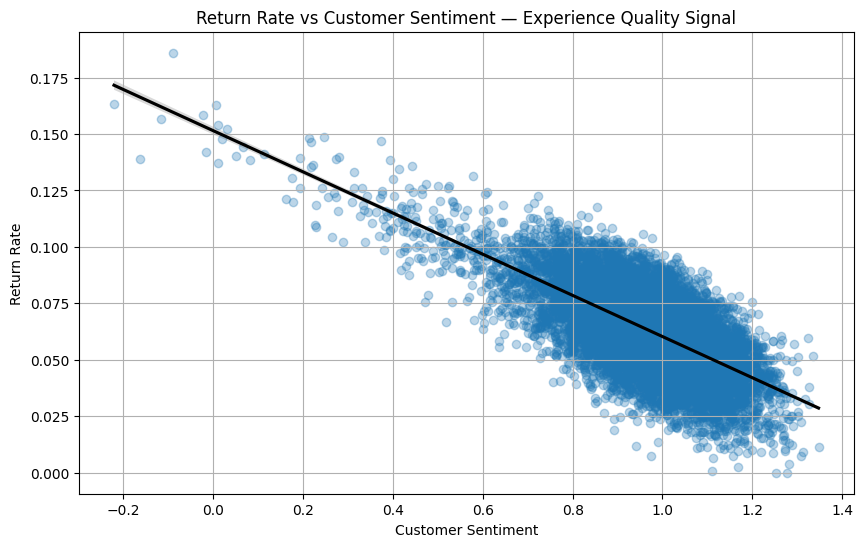

In [54]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='customer_sentiment',
    y='return_rate',
    data=df,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Return Rate vs Customer Sentiment — Experience Quality Signal")
plt.xlabel("Customer Sentiment")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 3. Return Rate vs Price (Value Perception Effect)**
**🎯 Goal**

See if high prices cause more returns (value mismatch).

**📊 Plot: Scatter + LOWESS**

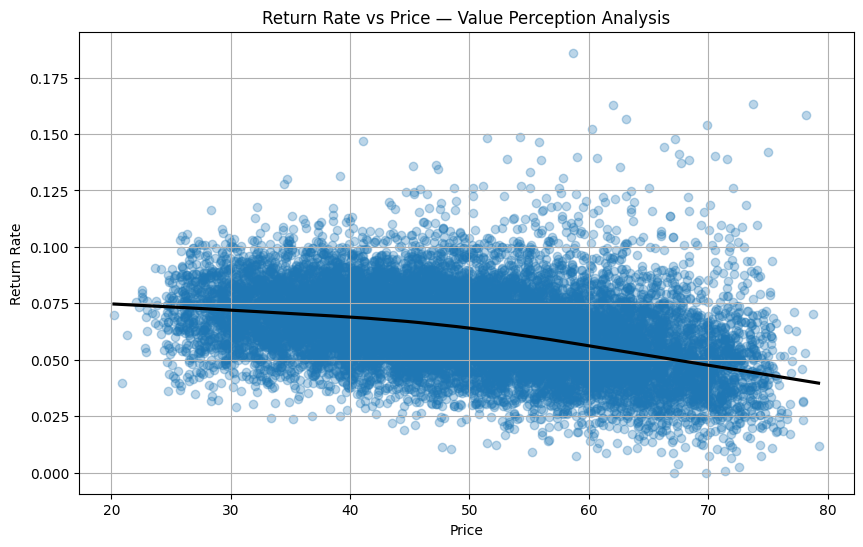

In [55]:
plt.figure(figsize=(10, 6))
sns.regplot(
    x='price',
    y='return_rate',
    data=df,
    lowess=True,
    scatter_kws={'alpha': 0.3},
    line_kws={'color': 'black'}
)
plt.title("Return Rate vs Price — Value Perception Analysis")
plt.xlabel("Price")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **🔹 4. Return Rate Under High Promotions**
**🎯 Goal**

Test whether promotions cause quality or satisfaction issues.

**📊 Plot: High Promo vs Low Promo Return Rates**

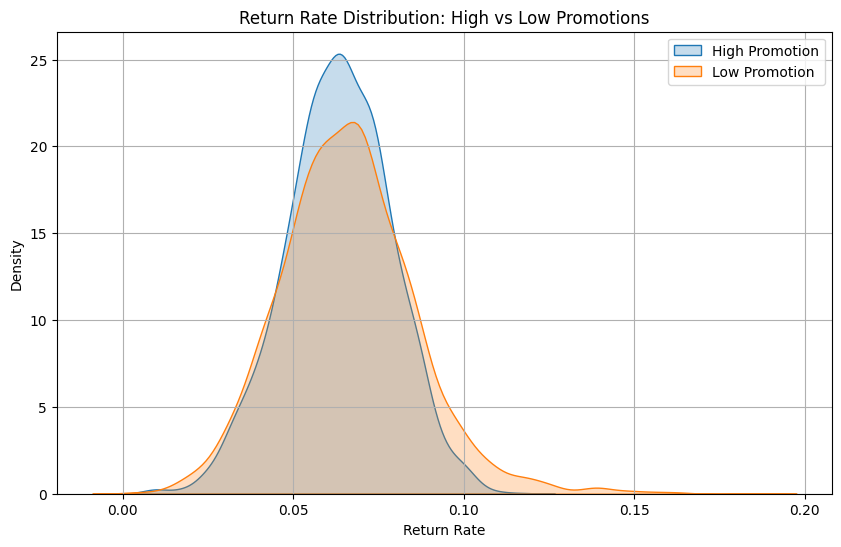

In [56]:
high_promo = df[df['promotion_intensity'] >= df['promotion_intensity'].quantile(0.75)]
low_promo = df[df['promotion_intensity'] <= df['promotion_intensity'].quantile(0.25)]

plt.figure(figsize=(10, 6))
sns.kdeplot(high_promo['return_rate'], label="High Promotion", fill=True)
sns.kdeplot(low_promo['return_rate'], label="Low Promotion", fill=True)
plt.title("Return Rate Distribution: High vs Low Promotions")
plt.xlabel("Return Rate")
plt.ylabel("Density")
plt.legend()
plt.grid(True)
plt.show()

### **🔹 5. Return Rate vs Discount + Sentiment (Advanced Interaction)**
**🎯 Goal**

Prove that discounts only increase returns when sentiment is low.

**📊 Plot: Bubble Chart**

/usr/local/lib/python3.12/dist-packages/matplotlib/collections.py:1008: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


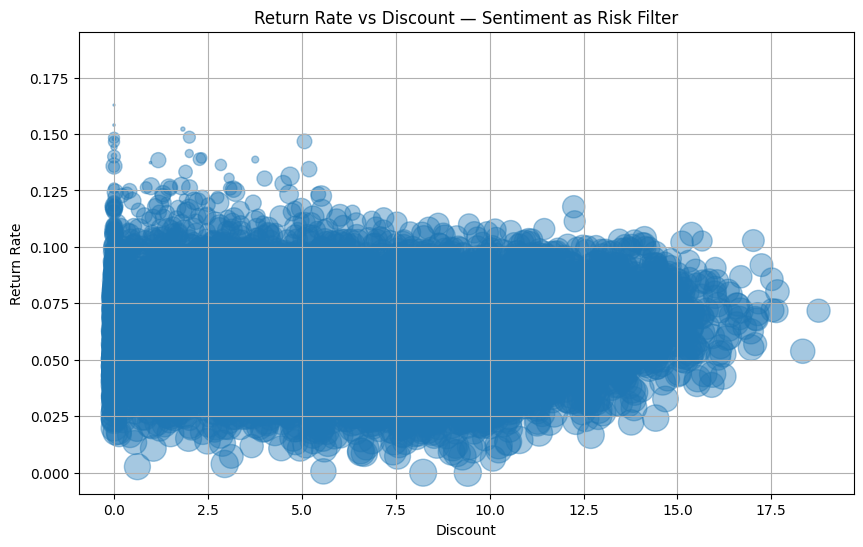

In [57]:
plt.figure(figsize=(10, 6))
plt.scatter(
    df['discount'],
    df['return_rate'],
    s=df['customer_sentiment'] * 300,
    alpha=0.4
)
plt.title("Return Rate vs Discount — Sentiment as Risk Filter")
plt.xlabel("Discount")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

# **🔟 Correlation & Interaction Insights (Advanced EDA)**

### **✅ 1. Enhanced Correlation Heatmap (with values & clustering)**
**📊 Purpose**

Detect feature clusters and redundant variables using hierarchical clustering.

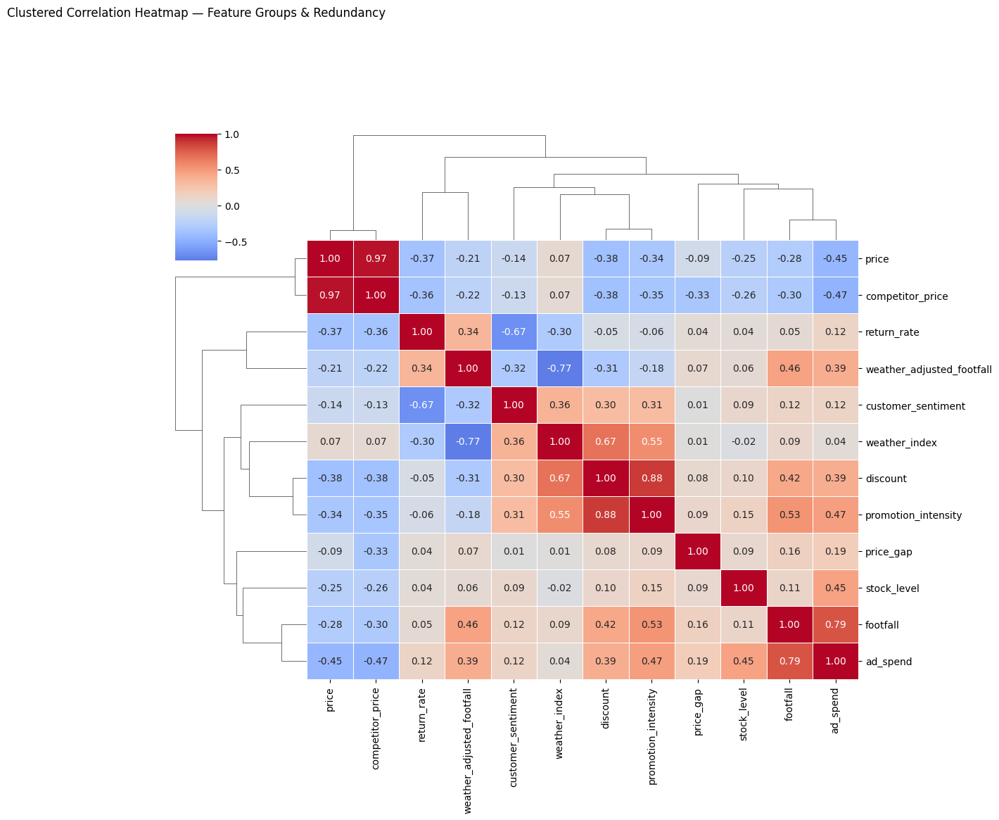

In [58]:
df_numeric = df.select_dtypes(include=["number"])

corr = df_numeric.corr()

sns.clustermap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    figsize=(12, 10)
)
plt.title("Clustered Correlation Heatmap — Feature Groups & Redundancy", pad=120)
plt.show()


### **✅ 2. Correlation Bar Plot (Feature Importance Proxy)**
**📊 Purpose**

Find variables most correlated with Footfall and Return Rate.

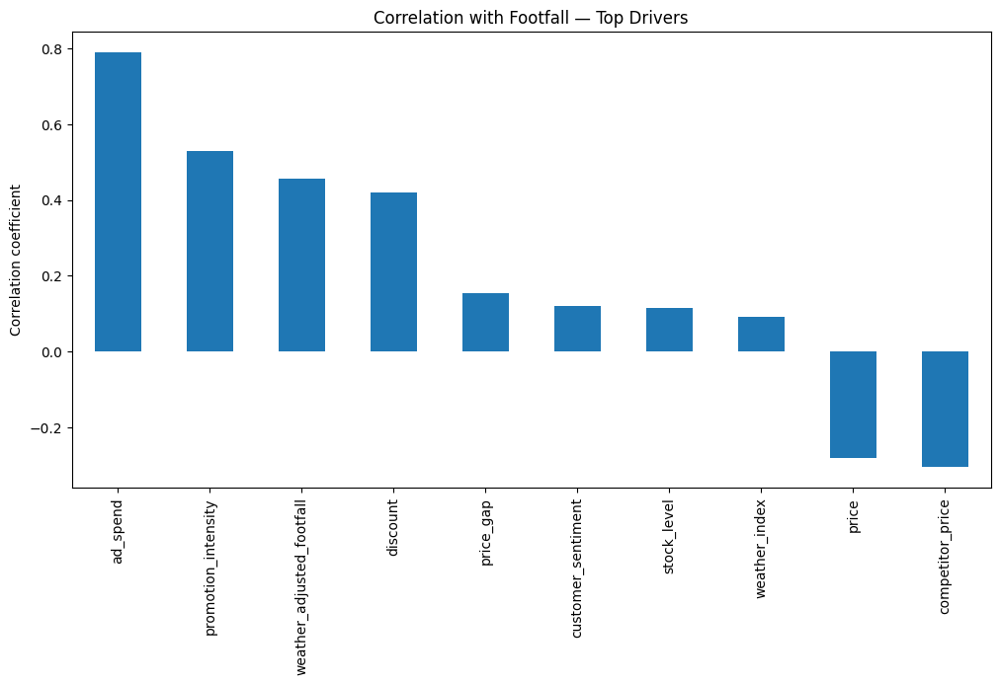

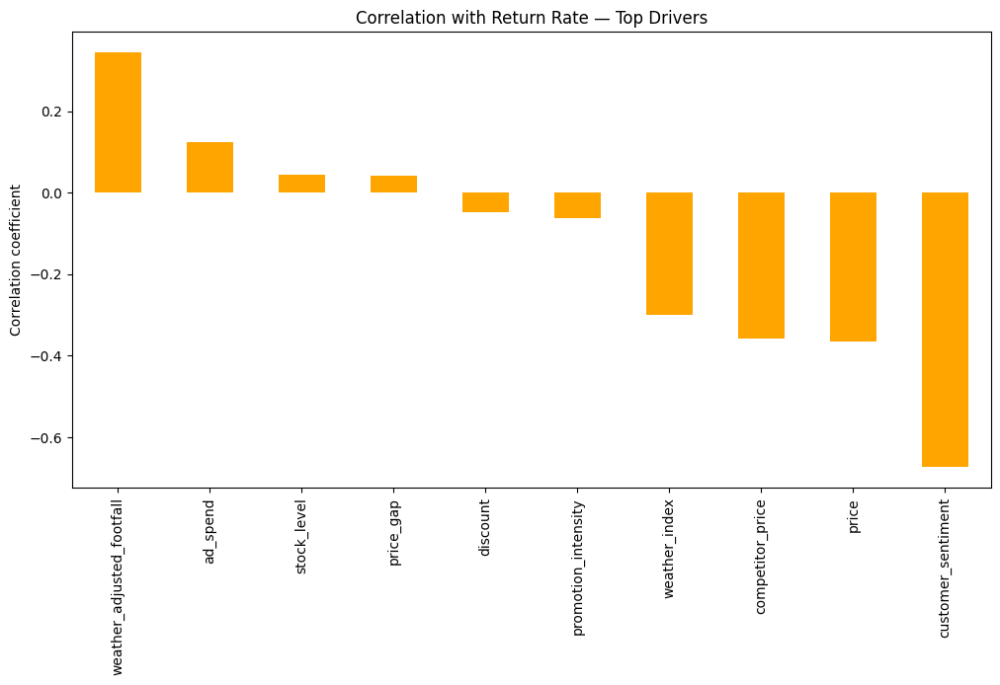

In [59]:
target_corr = corr[['footfall', 'return_rate']].drop(['footfall', 'return_rate']).copy()

plt.figure(figsize=(12, 6))
target_corr['footfall'].sort_values(ascending=False).plot(kind='bar')
plt.title("Correlation with Footfall — Top Drivers")
plt.ylabel("Correlation coefficient")
plt.show()

plt.figure(figsize=(12, 6))
target_corr['return_rate'].sort_values(ascending=False).plot(kind='bar', color='orange')
plt.title("Correlation with Return Rate — Top Drivers")
plt.ylabel("Correlation coefficient")
plt.show()

### **✅ 3. Pairplot for Key Interaction Variables (Stylish)**
**📊 Purpose**

Visualize pairwise relationships among key variables.

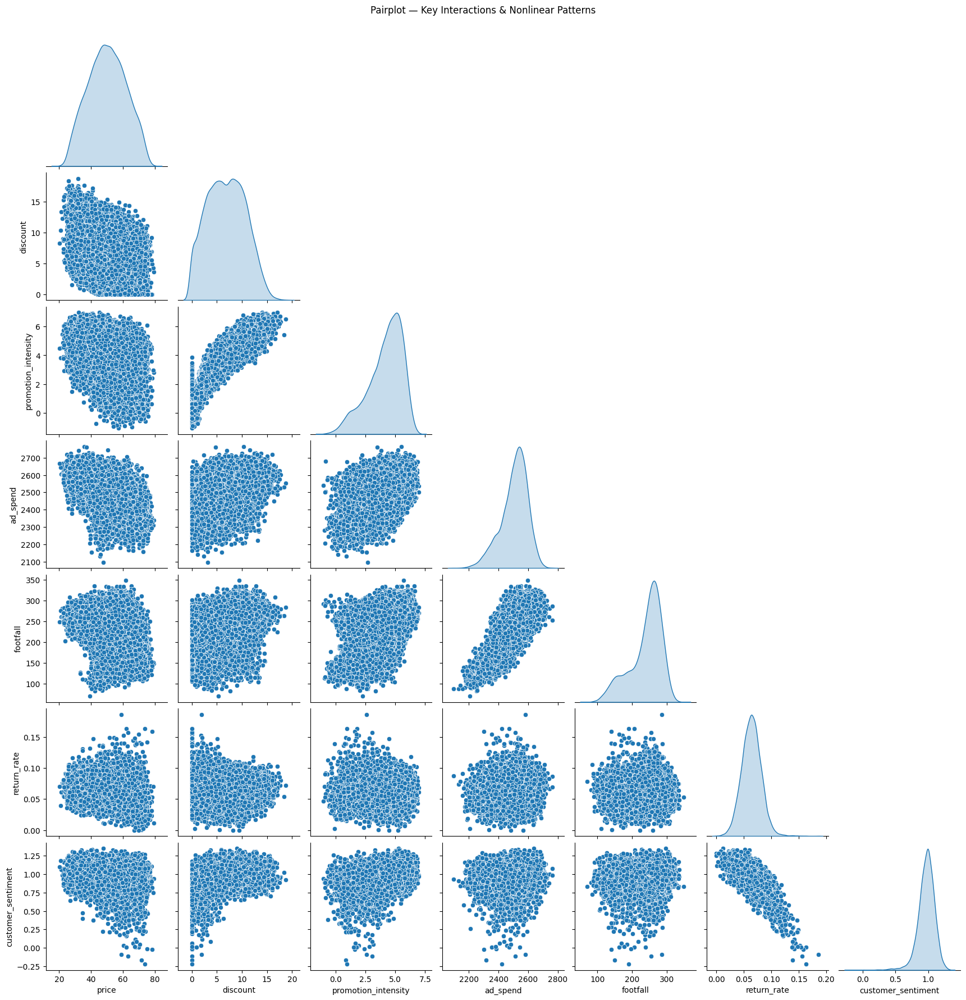

In [60]:
key_cols = ['price', 'discount', 'promotion_intensity', 'ad_spend', 'footfall', 'return_rate', 'customer_sentiment']

sns.pairplot(df[key_cols], diag_kind='kde', corner=True)
plt.suptitle("Pairplot — Key Interactions & Nonlinear Patterns", y=1.02)
plt.show()

### **✅ 4. Correlation Network Graph (Feature Clusters)**
**📊 Purpose**

Use graph theory to show clusters & strong connections.

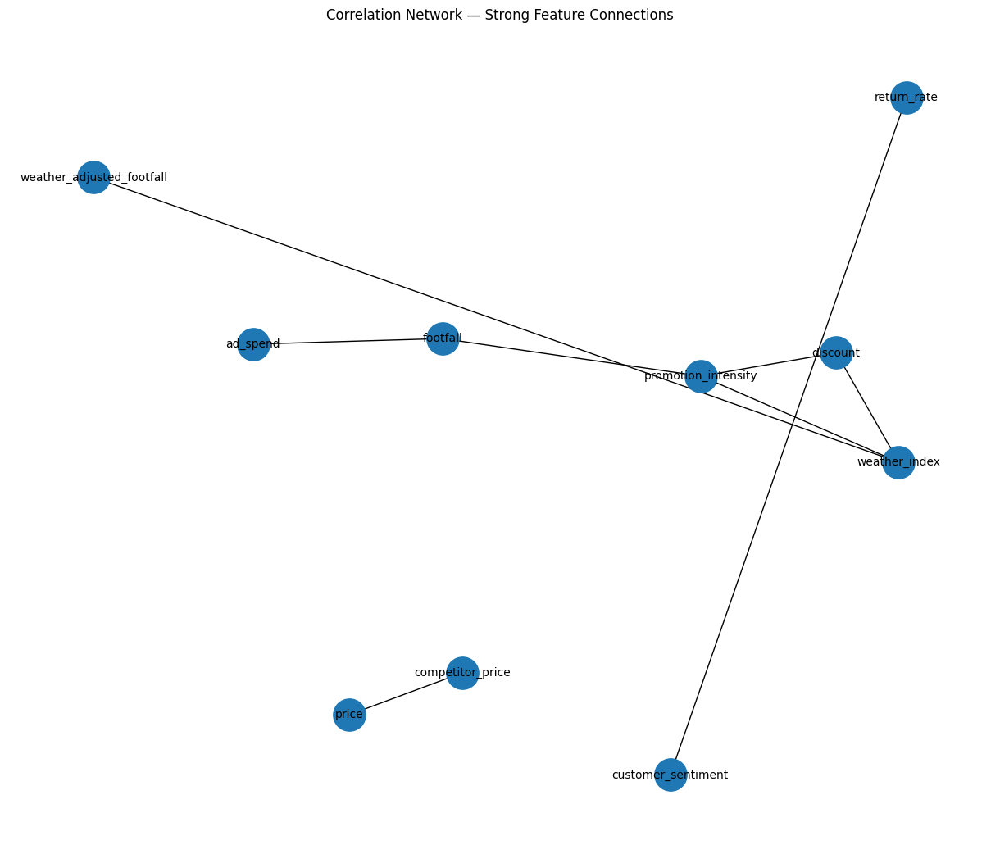

In [61]:
import networkx as nx

corr_threshold = 0.5
G = nx.Graph()

for i in corr.columns:
    for j in corr.columns:
        if i != j and abs(corr.loc[i, j]) > corr_threshold:
            G.add_edge(i, j, weight=corr.loc[i, j])

plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, pos, with_labels=True, node_size=800, font_size=10)
plt.title("Correlation Network — Strong Feature Connections")
plt.show()

### **✅ 5. Mediation Insight Plot: Discount → Sentiment → Return Rate**
**📊 Purpose**

Prove that sentiment mediates the relationship between discount and returns.

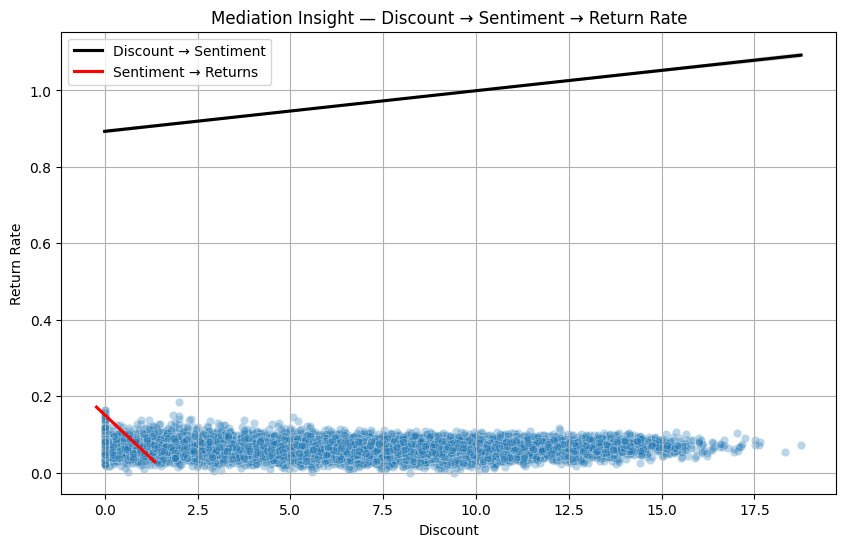

In [62]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x='discount', y='return_rate', data=df, alpha=0.3)
sns.regplot(x='discount', y='customer_sentiment', data=df, scatter=False, color='black', label='Discount → Sentiment')
sns.regplot(x='customer_sentiment', y='return_rate', data=df, scatter=False, color='red', label='Sentiment → Returns')

plt.title("Mediation Insight — Discount → Sentiment → Return Rate")
plt.xlabel("Discount")
plt.ylabel("Return Rate")
plt.legend()
plt.grid(True)
plt.show()

# **1️⃣1️⃣ Business Scenarios & Segmentation (EDA Master Move)**

### **✅ 1. Segmenting by Price & Promotion (Core Revenue Strategy)**
**🎯 Goal**

Compare High Price + High Promo vs Low Price + Low Promo and show which drives more footfall & sales.

**📊 Plot: 2D Segmentation + Boxplots**

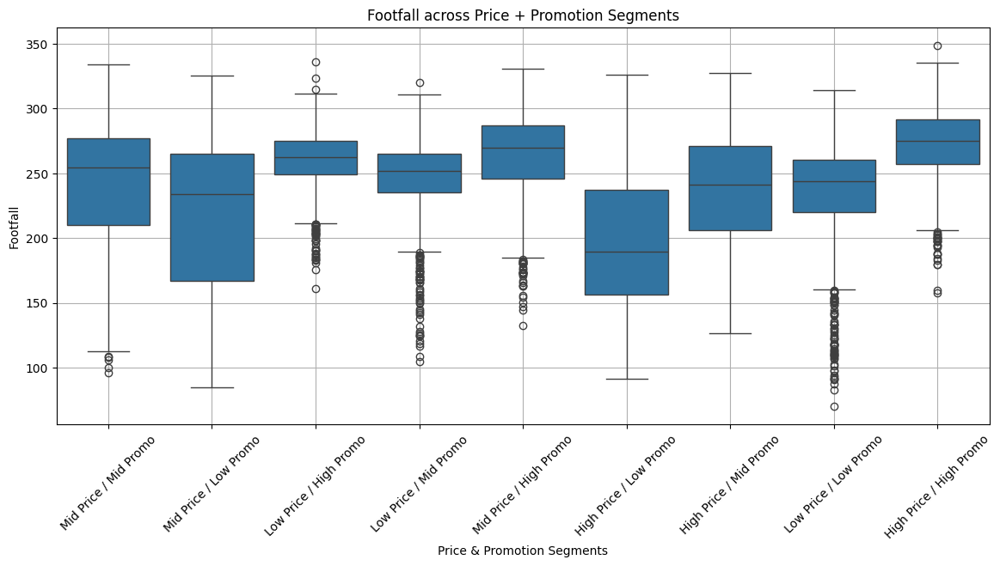

In [63]:
# Create segments
df['price_segment'] = pd.qcut(df['price'], q=3, labels=['Low', 'Mid', 'High'])
df['promo_segment'] = pd.qcut(df['promotion_intensity'], q=3, labels=['Low', 'Mid', 'High'])

# Combine segments
df['price_promo_segment'] = df['price_segment'].astype(str) + " Price / " + df['promo_segment'].astype(str) + " Promo"

plt.figure(figsize=(14, 6))
sns.boxplot(x='price_promo_segment', y='footfall', data=df)
plt.xticks(rotation=45)
plt.title("Footfall across Price + Promotion Segments")
plt.xlabel("Price & Promotion Segments")
plt.ylabel("Footfall")
plt.grid(True)
plt.show()

### **✅ 2. High Footfall + Low Sentiment (Problem Stores)**
**🎯 Goal**

Find dangerous traffic — high footfall but low customer satisfaction.

**📊 Plot: Scatter with Quadrant Segmentation**

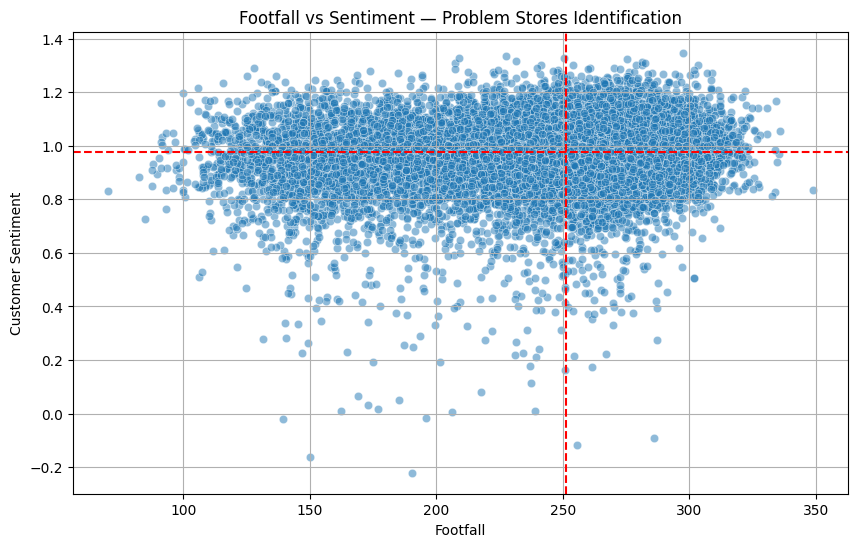

In [64]:
# Define thresholds
footfall_med = df['footfall'].median()
sentiment_med = df['customer_sentiment'].median()

plt.figure(figsize=(10, 6))
sns.scatterplot(x='footfall', y='customer_sentiment', data=df, alpha=0.5)

plt.axvline(footfall_med, color='red', linestyle='--')
plt.axhline(sentiment_med, color='red', linestyle='--')

plt.title("Footfall vs Sentiment — Problem Stores Identification")
plt.xlabel("Footfall")
plt.ylabel("Customer Sentiment")
plt.grid(True)
plt.show()

### **✅ 3. High Ad Spend + Low Returns (Efficient Campaigns)**
**🎯 Goal**

Identify high ROI marketing scenarios.

**📊 Plot: Scatter + Highlight Efficient Zone**

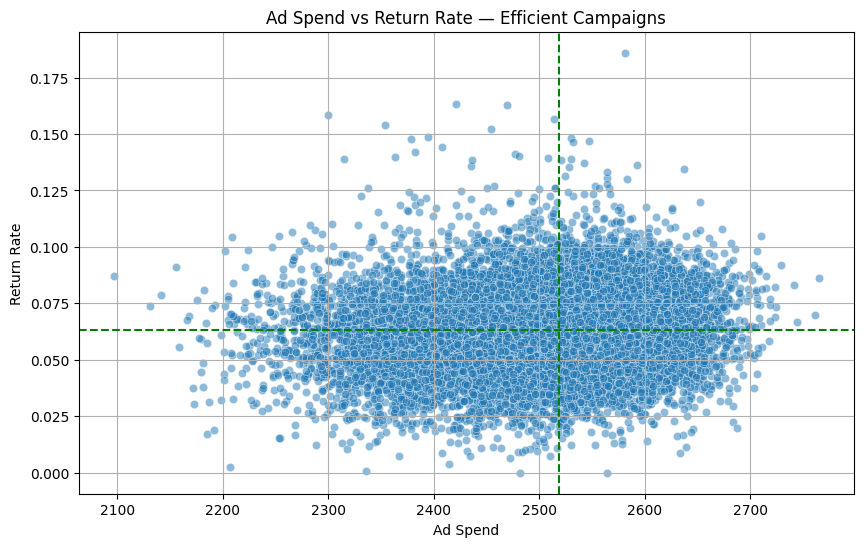

In [65]:
ad_med = df['ad_spend'].median()
ret_med = df['return_rate'].median()

plt.figure(figsize=(10, 6))
sns.scatterplot(x='ad_spend', y='return_rate', data=df, alpha=0.5)

plt.axvline(ad_med, color='green', linestyle='--')
plt.axhline(ret_med, color='green', linestyle='--')

plt.title("Ad Spend vs Return Rate — Efficient Campaigns")
plt.xlabel("Ad Spend")
plt.ylabel("Return Rate")
plt.grid(True)
plt.show()

### **✅ 4. Segmentation Summary Table (Extra Notebook Value)**
**🎯 Goal**

Provide a clean table summary of segments.

In [66]:
segment_summary = df.groupby('price_promo_segment').agg({
    'footfall': ['mean', 'median'],
    'return_rate': ['mean', 'median'],
    'customer_sentiment': ['mean', 'median']
}).reset_index()

segment_summary.columns = ['Segment', 'Footfall Mean', 'Footfall Median',
                           'Return Mean', 'Return Median',
                           'Sentiment Mean', 'Sentiment Median']

segment_summary

,Segment,Footfall Mean,Footfall Median,Return Mean,Return Median,Sentiment Mean,Sentiment Median
0,High Price / High Promo,272.454892,274.846097,0.051193,0.051147,1.003885,1.003938
1,High Price / Low Promo,196.752714,189.735401,0.059959,0.057743,0.885704,0.912116
2,High Price / Mid Promo,236.983104,241.037971,0.051349,0.050916,0.984989,0.993456
3,Low Price / High Promo,261.127825,262.574271,0.068826,0.068916,0.999120,0.998456
4,Low Price / Low Promo,233.559891,244.009864,0.071471,0.071335,0.961668,0.968872
5,Low Price / Mid Promo,248.504836,252.025309,0.070972,0.070948,0.978207,0.982592
6,Mid Price / High Promo,264.320084,269.675755,0.062123,0.062118,0.997683,0.998385
7,Mid Price / Low Promo,217.846855,234.297717,0.068836,0.068332,0.928839,0.941186
8,Mid Price / Mid Promo,241.932724,254.271185,0.063415,0.062966,0.984742,0.988158


---

## **Thank You**

Thank you for going through this notebook.  
I hope the insights and visualizations provided useful and actionable perspectives on retail sales dynamics.

Happy learning! 🚀
